## Can we use Dynesty for Asteroid GP Models?

I want to explore Dynesty as an alternative to emcee for sampling the posteriors of Gaussian Process models for asteroid light curves.

In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib notebook
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import pandas as pd
import scipy.optimize as op

import george
from george import kernels

from astropy.stats import LombScargle
from gatspy import periodic

import dynesty
from dynesty import plotting as dyplot
from dynesty import utils as dyfunc

import corner

Let's load some fun asteroid data:

In [2]:
#datadir = "/epyc/users/dhuppenk/data/asteroid_sims/"
datadir = "/Users/danielahuppenkothen/work/data/asteroid_sims/"


#fname = "1291_lc_49627_to_49787.txt" # Phryge
fname = "3200_lc_49627_to_49787.txt" # Phaeton


Here's the "true" (= best measured) period for 1291 Phryne: 

In [3]:
true_period = 3.603957 # 3200 Phaeton
#true_period = 5.58410 # 1291 Phryge

In [4]:
df = pd.read_csv(datadir + fname, names=["time", "flux"], sep=" ")

In [5]:
df.head()

,time,flux
0,2.449627e+06,1.146316
1,2.449627e+06,1.146316
2,2.449627e+06,1.144067
3,2.449627e+06,1.141392
4,2.449627e+06,1.138726


In [6]:
len(df)

460830

Cool. Let's plot that:

<IPython.core.display.Javascript object>


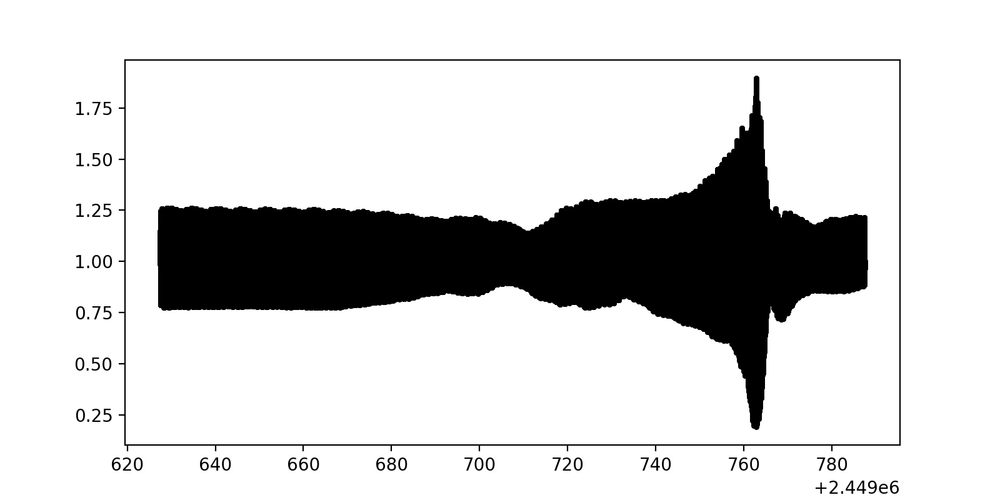

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.scatter(df.time, df.flux, s=5, c="black")

That's ... a wall of black! What does that look like zoomed in?

<IPython.core.display.Javascript object>


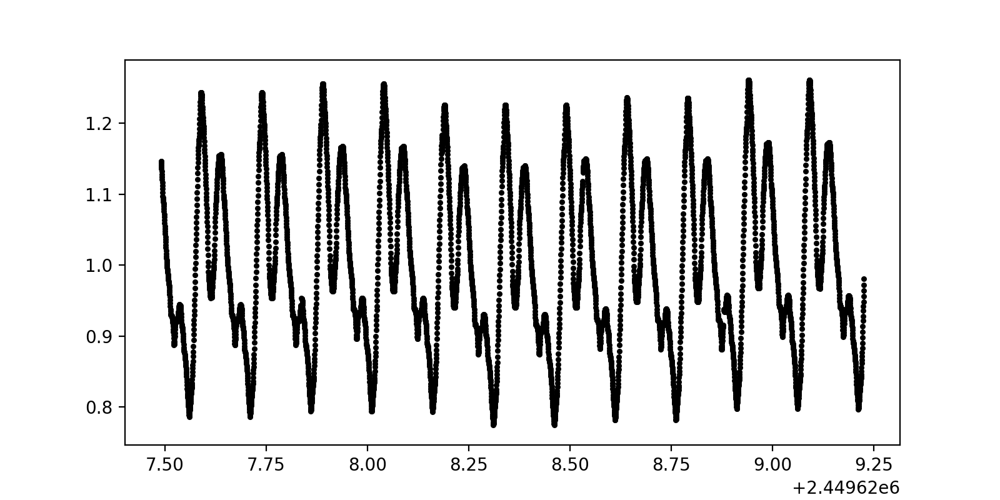

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.scatter(df.time[:5000], df.flux[:5000], s=5, c="black")

So that's a fun pattern for an asteroid light curve. The light curve is also *really* well sampled. 

Let's get out a light curve of, say, 5 days, with a total of 500 data points:

In [9]:
df.loc[df.index[-1], "time"] - df.loc[df.index[0], "time"]

159.99962345743552

In [10]:
t0 = np.float(df.loc[df.index[0], "time"])

In [11]:
tseg = 5.0 # length of the total light curve

In [12]:
tmax = t0 + tseg # last data point

In [13]:
max_ind = np.array(df.time).searchsorted(tmax)

In [14]:
tshort = np.array(df.time)[:max_ind]
fshort = np.array(df.flux)[:max_ind]

In [15]:
len(tshort)

14401

What does this shorter light curve look like?

<IPython.core.display.Javascript object>


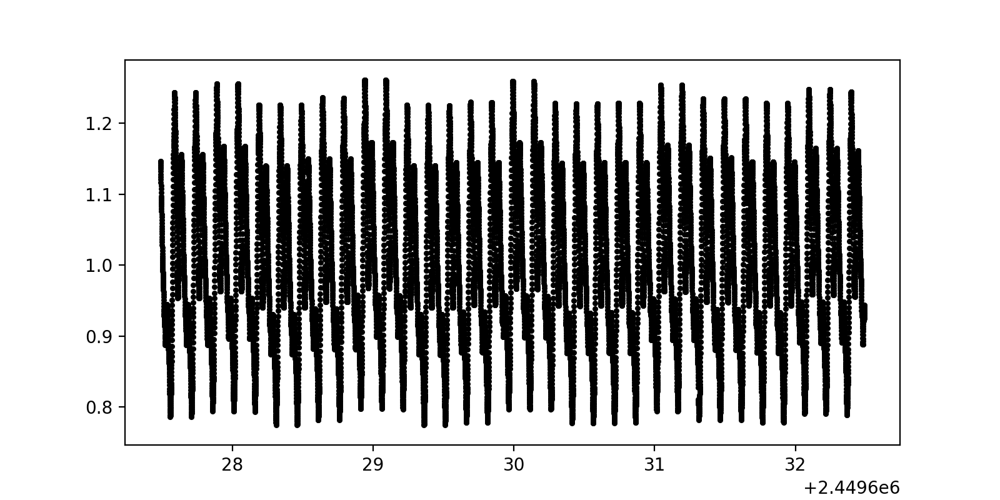

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.scatter(tshort, fshort, s=5, c="black")

That's a lot of cycles! Now let's randomly subsample:

In [17]:
def subsample(time, flux, flux_err=None, npoints=100, kind="random",
              time_unit="days", night_length=8.0, seed=42,
              sigma=0.0, mean_flux=0.0):
    """
    Subsample an existing high-resolution time series (e.g. simulated) 
    using different sampling patterns.
    
    Parameters
    ----------
    time : numpy.ndarray
        The array of time stamps 
    
    flux : numpy.ndarray
        The array of flux values corresponding to the time 
        stamps in `time`
        
    npoints : int
        The number of data points to sub-sample
        
    kind : str, one of {random | telescope}
        The type of subsampling to perform. 
        There are different sampling patterns currently implemented:
            "random" : randomly sample `npoints` data points from 
                       `time` and `flux1`          
            "telescope": take day/night cycle into account, but randomly 
                         subsample within a "night"
            "sparse" : sparse asteroid sampling: 3 x 1-minute images, separated by 21-minute intervals,
                                                 whole night, for K nights in a row and N nights per semester
            "ztf" : 
            
    time_unit : str
        The unit of time that the `time` array is in.
    
    night_length : float
        The length of a night in hours for including day/night cycles
                
    seed : int
        Seed for the random number generator. Useful for reproducibility.
        
    Returns
    -------
    tsmall, fsmall, (ferrsmall) : the subsampled time series
    """
    
    if seed is not None:
        np.random.seed(seed)
    
    if kind == "random":
        # generate a random list of indices for sub-sampling
        idx = np.random.choice(np.arange(0, time.shape[0], 1, dtype=int), 
                               size=npoints, replace=False)

        tsmall = time[np.sort(idx)]
        fsmall = flux[np.sort(idx)]
        if flux_err is not None:
            ferrsmall = flux_err[np.sort(idx)]
        else:
            ferrsmall = np.zeros_like(fsmall) + sigma

    elif kind == "telescope":
        # if time unit is in days, convert length of night and day 
        # from hours into days
        if time_unit == "days":
            night_length /= 24.0
            tseg = time[-1] - time[0] # total length of the time series
        else:
            tseg = (time[-1] - time[0]) / 24.0
        
        nightly_points = int(npoints/tseg)
        
        tstart = time[0]
        tend = tstart + night_length
        
        tsmall = []
        fsmall = []
        
        ferrsmall = []
        
        while tend <= time[-1]:
            min_ind = time.searchsorted(tstart)
            max_ind = time.searchsorted(tend)

            tshort = time[min_ind:max_ind]
            fshort = flux[min_ind:max_ind]


            idx = np.random.choice(np.arange(0, tshort.shape[0], 1, dtype=int), 
                           size=nightly_points, replace=False)

            tsample = tshort[np.sort(idx)]
            fsample = fshort[np.sort(idx)]
            
            tsmall.append(tsample)
            fsmall.append(fsample)
            
            if flux_err is not None:
                ferrshort = flux_err[min_ind:max_ind]
                ferrsample = ferrshort[np.sort(idx)]
                ferrsmall.append(ferrsample)
            else:
                ferrsmall.append(np.zeros_like(fsample) + sigma)
            
            if time_unit == "days":
                tstart += 1.0
                tend += 1.0
            elif time_unit == "hours":
                tstart += 24.0
                tend += 24.0
        
#        tsmall = np.hstack(np.array(tsmall))
#        fsmall = np.hstack(np.array(fsmall))
#        if flux_err is not None:
#            ferrsmall = np.hstack(np.array(ferrsmall))
#            return tsmall, fsmall, ferrsmall
#        else:
#            return tsmall, fsmall
        
    elif kind == "sparse": 
        if time_unit == "days":
            night_length /= 24.0
            tseg = time[-1] - time[0] # total length of the time series
        else:
            tseg = (time[-1] - time[0]) / 24.0

        tstart = time[0]
        tend = tstart + night_length
        
        tsmall = []
        fsmall = []
        
        ferrsmall = []
        
        start_id = np.random.randint(0, 8, size=1)

        # one minute in fractions of days
        dt = 1./(60*24.)

        # start within the 24-minute interval of observing different asteroids
        tstart += start_id*(3*dt)

        while tend <= time[-1]:
            
            while tstart <= tend:
                for j in range(3):
                    tind = time.searchsorted(tstart)
                    tsmall.append(time[tind])
                    fsmall.append(flux[tind])
                    
                    if flux_err is not None:
                        ferrsmall.append(flux_err[tind])
                    else:
                        ferrsmall.append(sigma)
                        
                    tstart += dt
                
                tstart += 21.*dt
            
            if time_unit == "days":
                tstart += (1.0-night_length)
                tend += 1.0
            elif time_unit == "hours":
                tstart += (24.0 - night_length)
                tend += 24.0
        
#        if flux_err is not None:
#            return np.hstack(tsmall), np.hstack(fsmall), np.hstack(ferrsmall)
#        else:
#            return np.hstack(tsmall), np.hstack(fsmall)

    elif kind == "ztf":
        
        tstart = time[0]
        total_nights = time[-1] - time[0]
                    
        tsmall = []
        fsmall = []
        
        nnights = int(npoints/2.)
        if nnights > total_nights:
            raise ValueError("Number of selected nights is longer than total light curve.")

        dnights = np.random.randint(3, 6, size=npoints)
        dnights[1::2] = 0 
        nights = np.zeros(npoints, float) + dnights
        nights = nights.cumsum()

        if np.max(nights) > time[-1]:
            print("Warning! The requested observations are spread over more nights" + 
                  " than we currently have data for! Actual number of nights will be smaller!")
        
        #print("nights from start time: " + str(nights))
        
        # After 1 month, given field rises 2 hours earlier
        # Let's say we start @ +/- 1 hour of midnight
        start_times = (np.random.random(npoints) * 2.0 - 1.0) * 60.0
        start_times[::2] = start_times[1::2]
        dtimes = np.random.randint(30, 51, size=npoints)
        dtimes[::2] = 0
        times = nights + (start_times  + dtimes) / 60.0 /  24.0 + (nights * -2./24./30.)
        
        ferrsmall = []
        times += tstart
        
        for t in times:
            t_ind = time.searchsorted(t)
            tsmall.append(time[t_ind])
            fsmall.append(flux[t_ind])
        
            if flux_err is not None:
                ferrsmall.append(flux_err[t_ind])
            else:
                ferrsmall.append(sigma)
        
    fsmall = np.random.normal(np.hstack(fsmall), scale=np.hstack(ferrsmall)) + mean_flux
    
    return np.hstack(tsmall), np.hstack(fsmall), np.hstack(ferrsmall)



Let's try this function. We're going to make sure the mean magnitude adds up to 15, and we are going to include uncertainties of ~0.03:

In [18]:
sigmapsf = 0.03
mean_mag = 15

In [19]:
tsmall, fsmall, ferr = subsample(tshort, fshort, npoints=100, sigma=sigmapsf, mean_flux=mean_mag-1)

<IPython.core.display.Javascript object>


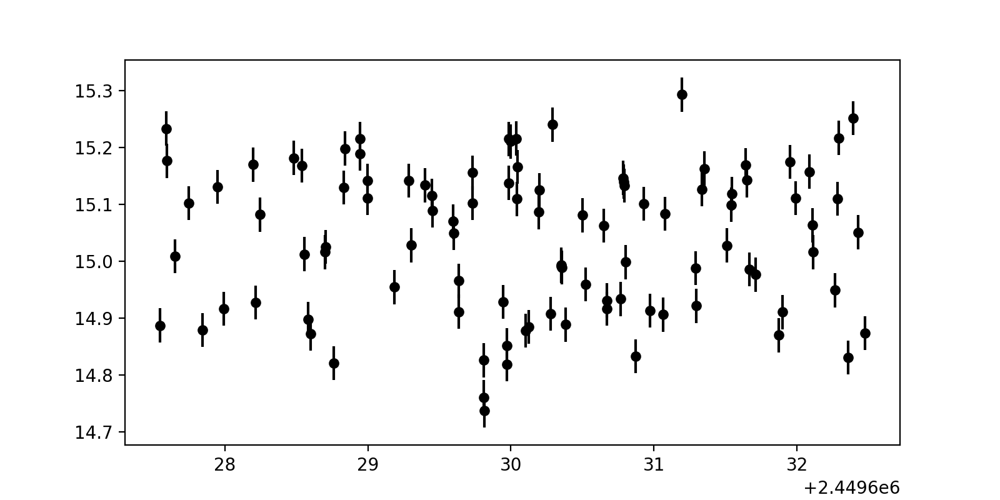

<ErrorbarContainer object of 3 artists>

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.errorbar(tsmall, fsmall, yerr=ferr, fmt="o", markersize=5, c="black")

Let's try the other sampling:

In [21]:
tsample, fsample, ferr = subsample(tshort, fshort, npoints=50, kind="telescope",
                                  sigma=sigmapsf, mean_flux=mean_mag-1)

<IPython.core.display.Javascript object>


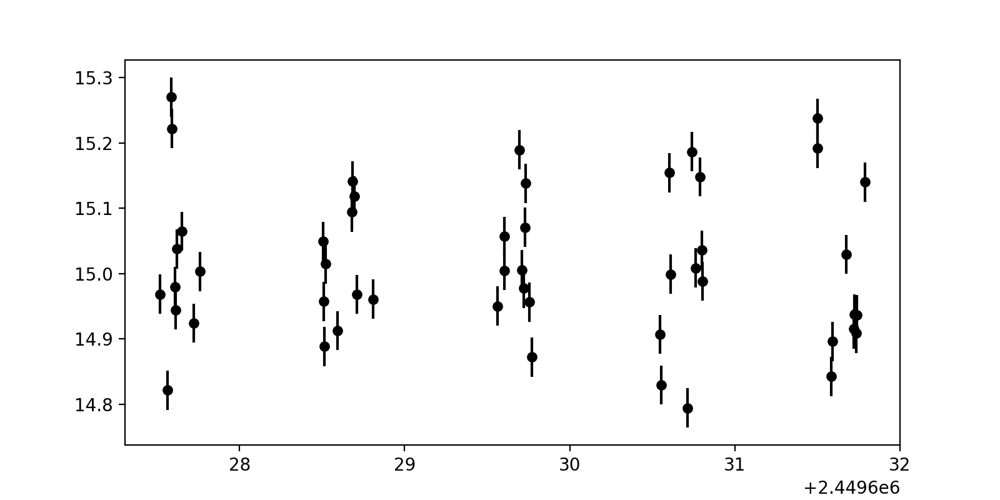

<ErrorbarContainer object of 3 artists>

In [22]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.errorbar(tsample, fsample, yerr=ferr, markersize=5, fmt="o", c="black")

Also going to try the sparse sampling:

In [23]:
tsample, fsample, ferr = subsample(tshort, fshort, npoints=50, kind="sparse",
                                   sigma=sigmapsf, mean_flux=mean_mag-1)

<IPython.core.display.Javascript object>


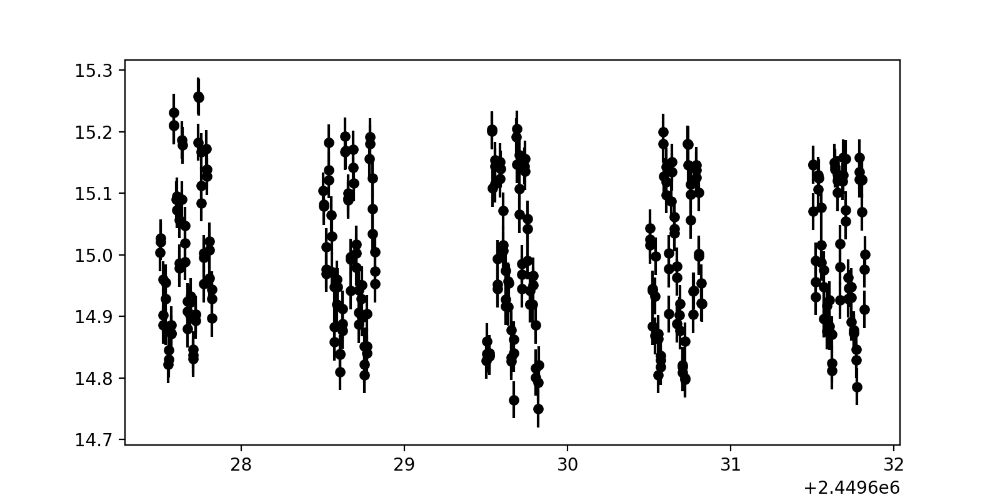

<ErrorbarContainer object of 3 artists>

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.errorbar(tsample, fsample, yerr=ferr, markersize=5, fmt="o", c="black")

In [463]:
tsample, fsample, ferr = subsample(time, flux, npoints=30, kind="ztf",
                                   sigma=sigmapsf, mean_flux=mean_mag-1)

<IPython.core.display.Javascript object>


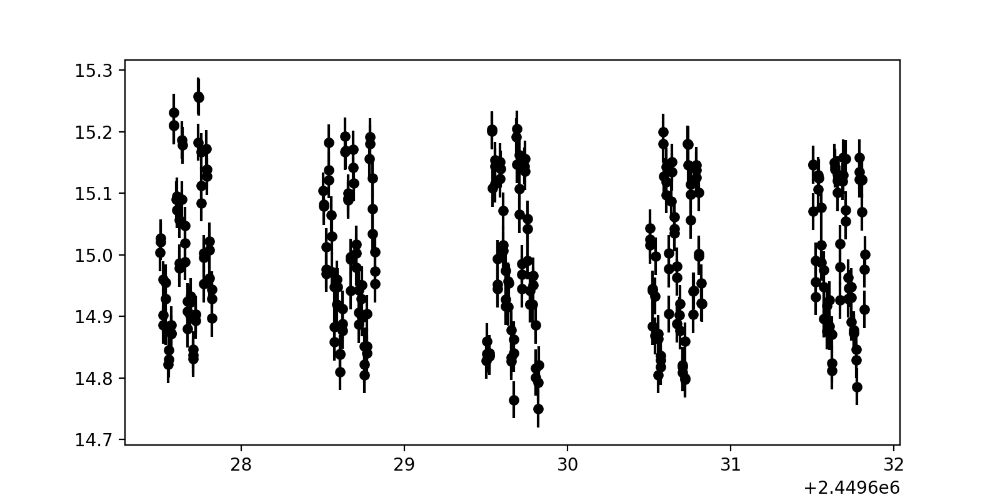

<ErrorbarContainer object of 3 artists>

In [25]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.errorbar(tsample, fsample, yerr=ferr, markersize=5, fmt="o", c="black")

/astro/users/dhuppenk/.conda/envs/dataviz/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


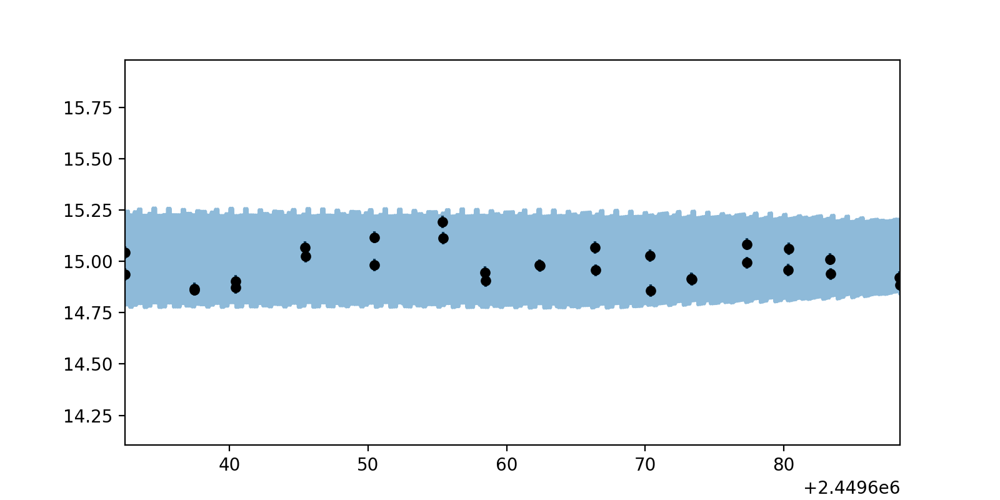

(2449632.4595062435, 2449688.3859272455)

In [465]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.errorbar(tsample, fsample, yerr=ferr, fmt="o", markersize=5, c="black")
ax.plot(time, flux+mean_mag-1, c=sns.color_palette()[0], lw=2, alpha=0.5)

ax.set_xlim(tsample[0], tsample[-1])

In [26]:
len(fsample)

300

## A first Try

Let's give this a first try. We'll try this with 100 data points distributed over 5 nights:

In [27]:
time = np.array(df["time"])
flux = np.array(df["flux"])

In [28]:
t_ind = time.searchsorted(time[0] + 5.0)

tshort = time[:t_ind]
fshort = flux[:t_ind]

In [29]:
tsample, fsample, ferr = subsample(tshort, fshort, npoints=100, kind="telescope", seed=200, sigma=0.01,
                                   mean_flux = mean_mag-1)

### Lomb-Scargle Periodogram

What does a typical Lomb-Scargle periodogram of this data set look like?

In [30]:
ls = LombScargle(tsample, fsample, ferr)

In [31]:
p_min = 1.0/24.0 # smallest period to search is 1 hour
p_max = 1.0 # largest period to search is T

In [32]:
oversampling = 5 # factor of oversampling the peaks
nfreq = int(oversampling*(p_max - p_min)/p_min) # number of frequencies

freq = np.linspace(1/p_max, 1/p_min, nfreq)

power = ls.power(freq)

In [33]:
true_freq = 1./(true_period/24.0)

In [34]:
2*true_freq

13.318693868989003

In [35]:
def make_lsp(time, flux, flux_err, p_min=1/24.0, p_max=1.0, oversampling=5, lsp_kwargs={}, nterms=1, use_gatspy=False):
    """
    Compute the Lomb-Scargle periodogram using the astropy LombScargle class.
    
    Parameters
    ----------
    time : numpy.ndarray
        The time stamps of the time series **IN DAYS**
        
    flux : numpy.ndarray
        Flux measurements corresponding to the time stamps
         
    flux_err : numpy.ndarray
        The flux uncertainties corresponding to the data. 

    p_min, p_max : float, float
        The minimum and maximum period to search, **IN DAYS**
        
    oversampling : int
        The oversampling factor; default is 5
        
    lsp_kwargs : dict
        Optional keyword arguments for astropy.stats.LombScargle
        
    Returns
    -------
    freq : numpy.ndarray
        The frequencies for which the Lomb-Scargle periodogram 
        was computed
        
    power : numpy.ndarray
        Normalized Lomb-Scargle power
        
    """
    # number of frequencies to sample
    nfreq = int(oversampling*(p_max - p_min)/p_min) # number of frequencies

    # make a list of frequencies 
    freq = np.linspace(1/p_max, 1/p_min, nfreq)
    
    if use_gatspy:
        model = periodic.LombScargle(fit_period=True, center_data=True, fit_offset=True, Nterms=nterms)
        model.optimizer.period_range = (p_min, p_max)
        
        model.fit(time, flux, flux_err)
        periods = 1/freq
        power = model.periodogram(periods)
        power = power
        
    else:
        # initialize the lomb-scargle periodogram
        ls = LombScargle(time, flux, dy=flux_err, **lsp_kwargs)

        # compute the power at each given frequency
        power = ls.power(freq)
    
    return freq, power

In [36]:
def plot_lsp(time, flux, flux_err=None, true_period=None, 
             p_min=1/24.0, p_max=1.0, oversampling=5, lsp_kwargs={},
             ax=None, nharmonics=0, legend=True, use_gatspy=False, nterms=1):
    
    """
    Plot a Lomb-Scargle periodogram of the data in (time, flux) and optionally 
    include the "true" period, if known. 
    
    Parameters
    ----------
    time : numpy.ndarray
        The time stamps of the time series **IN DAYS**
        
    flux : numpy.ndarray
        Flux measurements corresponding to the time stamps
         
    flux_err : numpy.ndarray
        The flux uncertainties corresponding to the data. 
        
    true_period : float
        For simulated data, we might know the true period from 
        which the data came. If so, this will plot a dashed line 
        where the true period should be in the Lomb-Scargle periodogram

    p_min, p_max : float, float
        The minimum and maximum period to search, **IN DAYS**
        
    oversampling : int
        The oversampling factor; default is 5
        
    lsp_kwargs : dict
        Optional keyword arguments for astropy.stats.LombScargle
     
    ax : matplotlib.Axes object
        A matplotlib.Axes object into which to plot the LSP. Useful 
        for including an LSP in a multi-panel figure. If not given, 
        this function will instantiate a new Figure.
        
    nharmonics : int, default 0
        The number of harmonics to plot apart from the true period. 
        Plotting harmonics can be useful if there's significant power 
        e.g. at 1/2 the actual period
        
    legend : bool, default True
        If true, include a legend
    

    """
    
    freq, power = make_lsp(time, flux, flux_err, p_min, p_max, oversampling, use_gatspy=use_gatspy, 
                           nterms=nterms)
    
    # array of corresponding periods
    periods = 1./freq
    
    # invert the arrays so that my plot goes from 
    # small periods --> large periods
    periods = periods[::-1]
    power = power[::-1]

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(8,4))

    # plot the Lomb-Scargle periodogram
    ax.semilogx(periods, power, lw=2, color="black", linestyle="steps-mid", alpha=0.7, label="data")

    ylim = ax.get_ylim()
    
    ax.vlines(true_period, ylim[0], ylim[1], color="purple", linestyle="dashed", lw=3, 
              label="true period")

    if nharmonics > 0:
        colours = sns.color_palette("viridis", n_colors=nharmonics)
        for n in range(nharmonics):
            true_period /= 2.0
            ax.vlines(true_period, ylim[0], ylim[1], color=colours[n], 
                      linestyle="dashed", lw=3, label="%.2f * true period"%(0.5/(n+1)))
    
    if legend:
        ax.legend()
        
    ax.set_xlim(np.min(periods), np.max(periods))

    ax.set_xlabel("Period [days]")
    ax.set_ylabel("Normalized Power")
    
    return ax

<IPython.core.display.Javascript object>


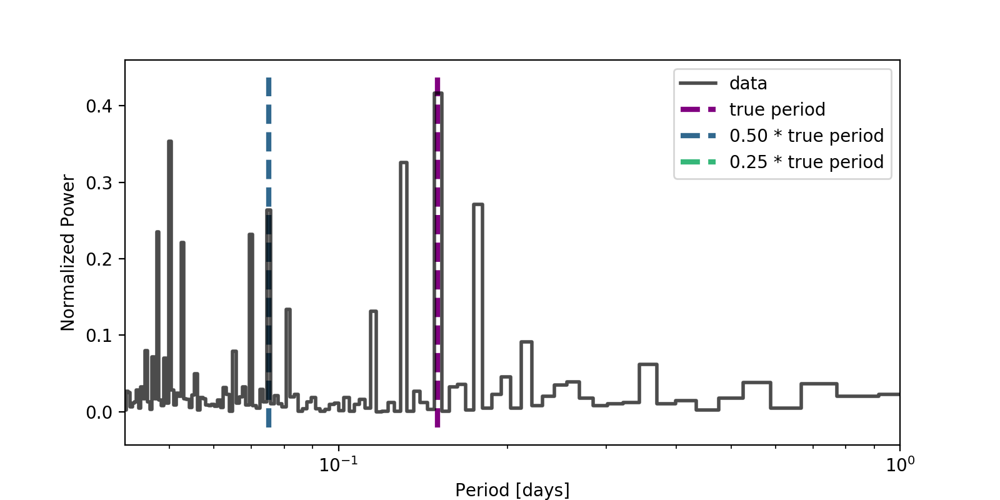

In [37]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))

plot_lsp(tsample, fsample, flux_err=ferr, true_period=true_period/24., ax=ax, nharmonics=2, 
         use_gatspy=False, oversampling=5)

/astro/users/dhuppenk/.conda/envs/dataviz/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


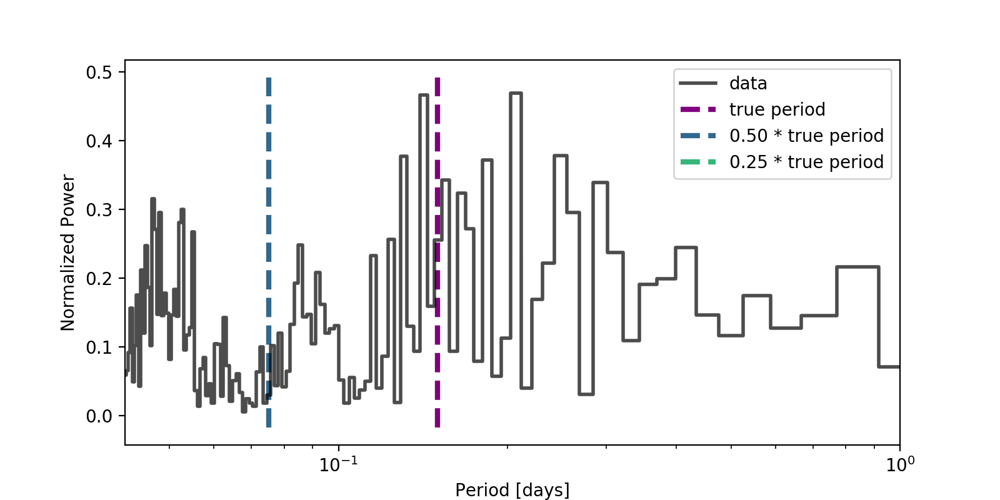

Finding optimal frequency:
 - Estimated peak width = 0.112
 - Using 5 steps per peak; omega_step = 0.0225
 - User-specified period range:  0.042 to 1
 - Computing periods at 6433 steps
Zooming-in on 5 candidate peaks:
 - Computing periods at 995 steps


In [475]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))

plot_lsp(tsample, fsample, flux_err=ferr, true_period=true_period/24., ax=ax, nharmonics=2, 
         use_gatspy=True, nterms=2)

### Gaussian Process Model

Ok, cool. Now we can set up our Gaussian Process:

In [38]:
# starting parameters
gamma = 1.0
log_period = np.log(5.8/24.0)
amp = 3.0

amp2 = 1.0
metric = 1.0

In [39]:
np.log(amp)

1.0986122886681098

First, set up the kernel. We're setting up a strictly periodic kernel here:

In [40]:
k1 = amp * kernels.ExpSine2Kernel(gamma=gamma, log_period=log_period)
#k2 = amp2 * kernels.ExpSquaredKernel(metric=metric) 
#kk = k1 * k2
kk = k1

In [41]:
gp = george.GP(kk, mean=np.mean(fsample), fit_mean=True,
               white_noise=np.log(np.mean(ferr)))
gp.compute(tsample)
print(gp.log_likelihood(fsample))
print(gp.grad_log_likelihood(fsample))


43.53511062716417
[-1.60444401e-03 -4.07964179e+00 -6.61891353e+00  1.17627911e+03]


<IPython.core.display.Javascript object>


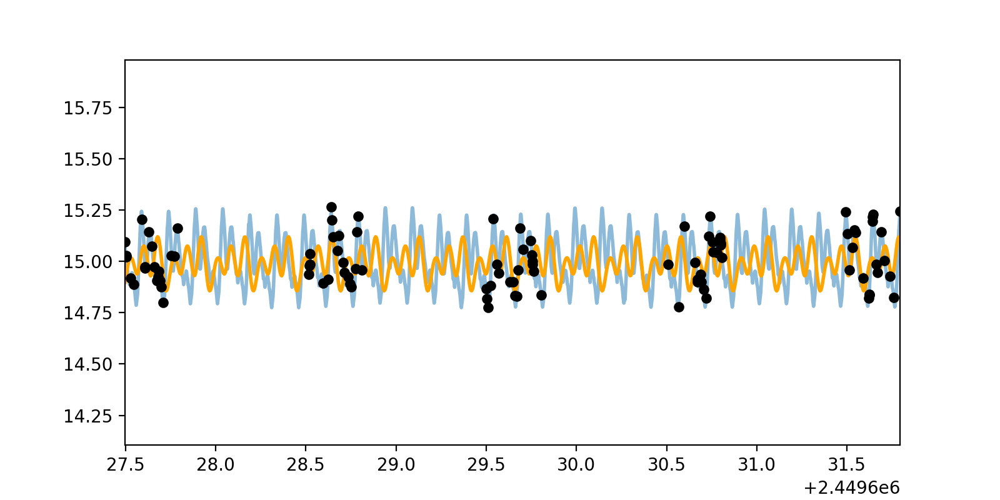

(2449627.498134568, 2449631.7934990316)

In [42]:
t_pred = np.linspace(tsample[0], tsample[-1], 1000)
mu = gp.sample_conditional(fsample, t_pred)

fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.errorbar(tsample, fsample, yerr=ferr, fmt="o", markersize=5, c="black")
ax.plot(time, flux+mean_mag-1, c=sns.color_palette()[0], lw=2, alpha=0.5)

ax.plot(t_pred, mu, c="orange", lw=2)

ax.set_xlim(tsample[0], tsample[-1])

Let's try to optimize this:

In [43]:

# Define the objective function (negative log-likelihood in this case).
def nll(p):
    gp.set_parameter_vector(p)
    ll = gp.log_likelihood(fsample, quiet=True)
    return -ll if np.isfinite(ll) else 1e25

# And the gradient of the objective function.
def grad_nll(p):
    gp.set_parameter_vector(p)
    return -gp.grad_log_likelihood(fsample, quiet=True)

# You need to compute the GP once before starting the optimization.
gp.compute(tsample)

# Print the initial ln-likelihood.
print(gp.log_likelihood(fsample))

# Run the optimization routine.
p0 = gp.get_parameter_vector()
results = op.minimize(nll, p0, jac=grad_nll, method="L-BFGS-B")


43.53511062716417


In [44]:
results.x

array([15.00314995,  0.76817922,  0.73926113, -1.03948909])

In [45]:
gp.get_parameter_names()

('mean:value',
 'kernel:k1:log_constant',
 'kernel:k2:gamma',
 'kernel:k2:log_period')

In [46]:

# Update the kernel and print the final log-likelihood.
gp.set_parameter_vector(results.x)
print(gp.log_likelihood(fsample))

65.54075780671695


<IPython.core.display.Javascript object>


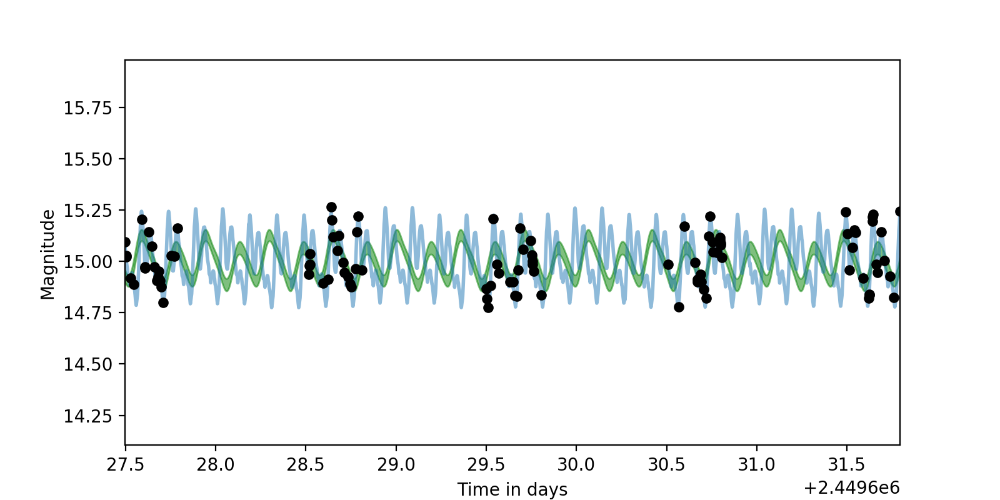

In [47]:
mu, var = gp.predict(fsample, t_pred, return_var=True)
std = np.sqrt(var)

fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.errorbar(tsample, fsample, yerr=ferr, fmt="o", markersize=5, c="black")
ax.plot(time, flux+mean_mag-1, c=sns.color_palette()[0], lw=2, alpha=0.5)

ax.fill_between(t_pred, mu+std, mu-std, color="g", alpha=0.5)

ax.set_xlim(tsample[0], tsample[-1])
#pl.xlim(t.min(), 2025)
ax.set_xlabel("Time in days")
ax.set_ylabel("Magnitude");

In [51]:
results.x

array([14.99451888, -4.42528229, 59.29783111, -0.79758132])

Hmmm, that optimization doesn't seem to work very well. Let's try to see what Dynesty does with this:

First, we need to define the transformation from the unit cube for the parameters to 
the actual parameter space. We're going to keep this simple for a start and use flat 
priors on the parameters:

In [48]:
gp.get_parameter_names()

('mean:value',
 'kernel:k1:log_constant',
 'kernel:k2:gamma',
 'kernel:k2:log_period')

In [49]:
def from_prior(u):
    
    # prior transform for the mean value
    min_mag = 12
    max_mag = 20
    pmean = (max_mag - min_mag) * u[0] + min_mag
    
    # prior transform for the GP log-constant
    min_logamp = -20
    max_logamp = 20
    plogamp = (max_logamp - min_logamp) * u[1] + min_logamp
    
    # prior transform for the kernel gamma
    min_loggamma = np.log(0.001)
    max_loggamma = np.log(100.0)
    ploggamma = (max_loggamma - min_loggamma) * u[2] + min_loggamma
    
    # prior transform for the log-period
    min_period = 1./24.0
    max_period = 1.0
    
    pperiod = (max_period - min_period) * u[3] + min_period
    
    return np.array([pmean, plogamp, ploggamma, pperiod])
    #min_logamp2 = -20
    #max_logamp2 = 20
    #plogamp2 = (max_logamp2 - min_logamp2) * u[4] + min_logamp2
    
    #min_logmetric = -10
    #max_logmetric = 10
    #plogmetric = (max_logmetric - min_logmetric) * u[5] + min_logmetric
    
    #return np.array([pmean, plogamp, ploggamma, pperiod, plogamp2, plogmetric])

In [50]:

ndim = len(gp.get_parameter_vector())

Define a likelihood function that takes the parameter values and returns the likelihood:

In [51]:
gp.get_parameter_names()

('mean:value',
 'kernel:k1:log_constant',
 'kernel:k2:gamma',
 'kernel:k2:log_period')

In [52]:
ndim

4

In [53]:
def loglike(p):
    pnew = [p[0], p[1], np.exp(p[2]), np.log(p[3])]#, p[4], p[5]]
    gp.set_parameter_vector(pnew)
    ll = gp.log_likelihood(fsample, quiet=True)
    return ll if np.isfinite(ll) else -1e25

Now we can instantiate the sampler:

In [54]:
sampler = dynesty.DynamicNestedSampler(loglike, from_prior, ndim, nlive=250, 
                                bound="multi", sample="rwalk")

In [55]:
sampler.run_nested(nlive_init=250)

iter: 20301 | batch: 11 | bound: 1138 | nc: 25 | ncall: 488190 | eff(%):  4.158 | loglstar: 111.961 < 120.015 < 119.056 | logz: 103.993 +/-  0.225 | stop:  0.960                  


In [56]:
results = sampler.results

<IPython.core.display.Javascript object>


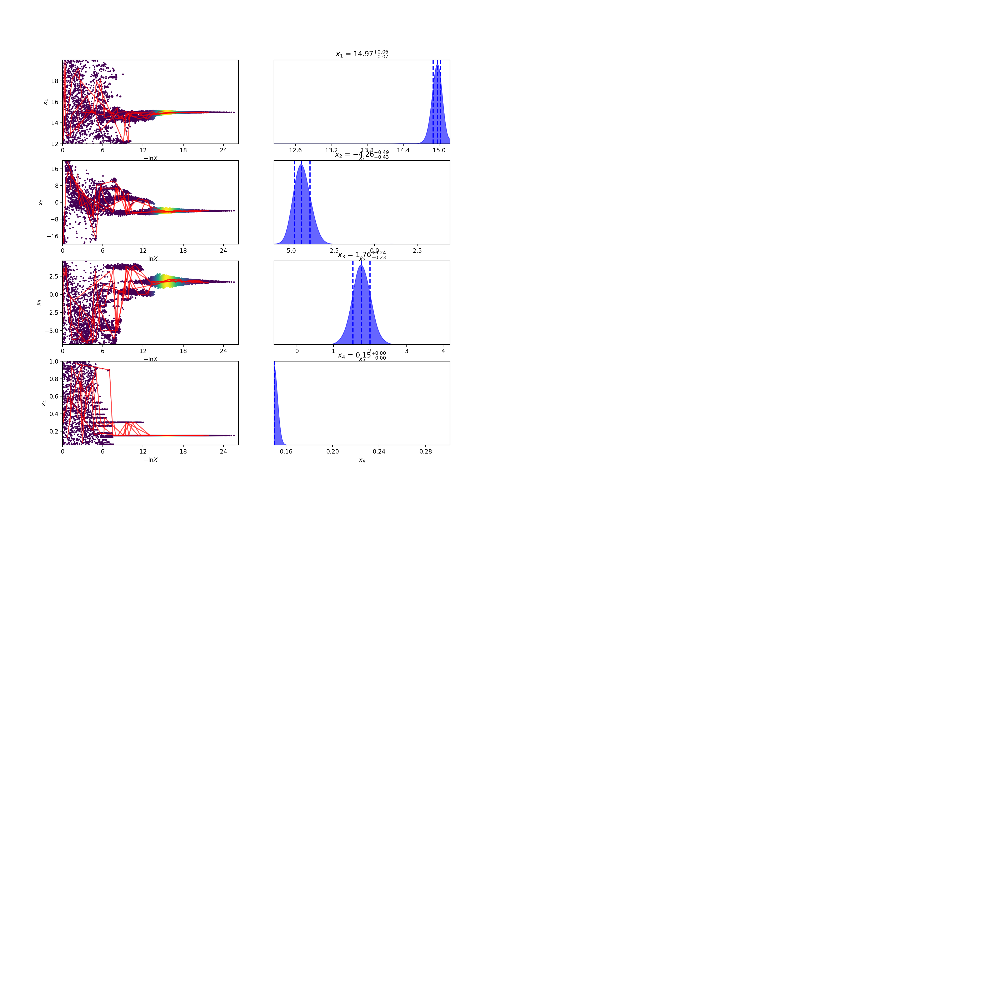

In [57]:
fig, axes = dyplot.traceplot(results, 
                             truth_color='black', show_titles=True,
                             trace_cmap='viridis', connect=True,
                             connect_highlight=range(5))

In [58]:
samples, weights = results.samples, np.exp(results.logwt - results.logz[-1])
mean, cov = dyfunc.mean_and_cov(samples, weights)

In [59]:
new_samples = dyfunc.resample_equal(samples, weights)

<IPython.core.display.Javascript object>


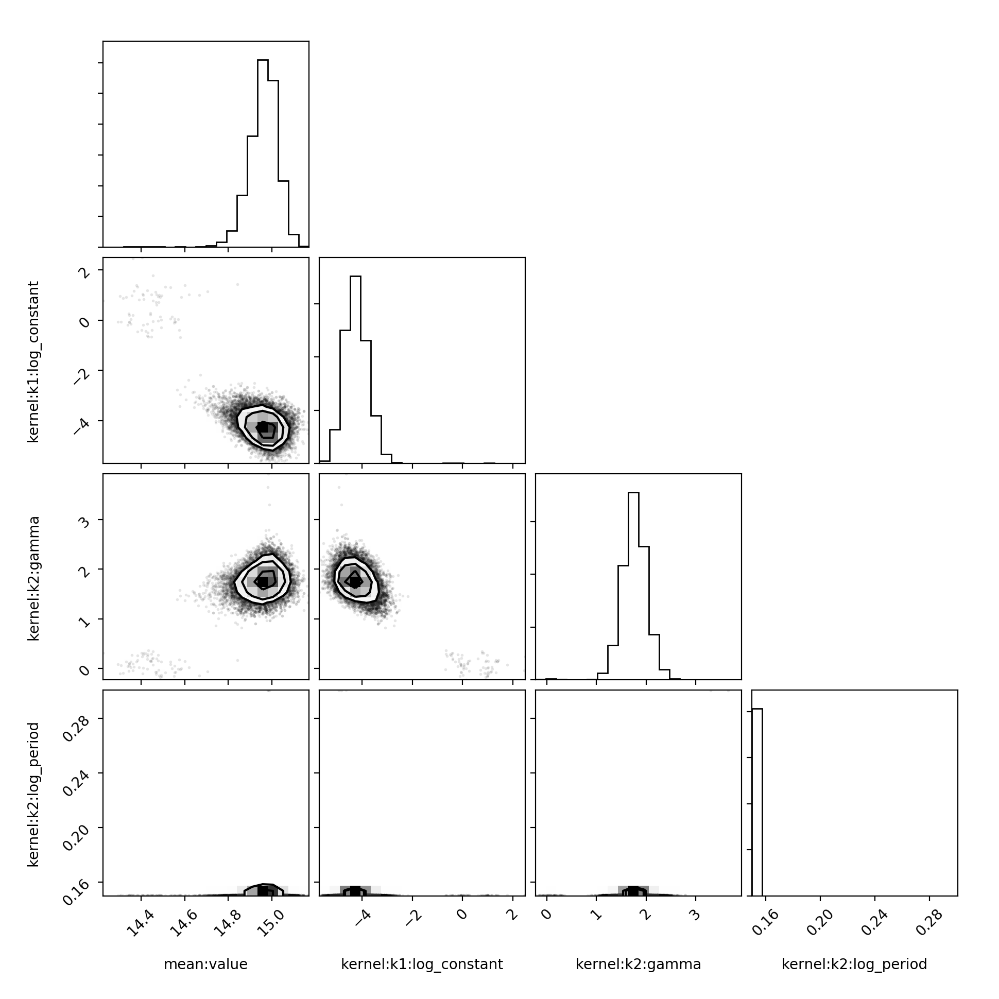

In [66]:
corner.corner(new_samples, labels=gp.get_parameter_names());

In [67]:
new_samples.shape

(20301, 4)

In [68]:
def plot_lightcurve(time, flux, flux_err=None, true_lightcurve=None, 
                    models=None, ax=None, colours=None):
    
    """
    Plot a light curve, potentially including the true underlying 
    model that produced the data (in the case of simulations), or model 
    light curves from MCMC. 
    
    Parameters
    ----------
    time : numpy.ndarray
        The time stamps of the periodic light curve
        
    flux : numpy.ndarray
        Flux measurements corresponding to the time stamps
         
    flux_err : numpy.ndarray
        The flux uncertainties corresponding to the data. 

    true_lightcurve : iterable containing (true_time, true_flux)
        In the case of simulated data, this contains the times and flux values from which the 
        simulated data was created (could be higher-resolution than the "data"), useful for 
        comparison between models created e.g. from MCMC samples and the true underlying process
                
    models : iterable of shape (model_time, numpy.ndarray of shape (nsamples, len(model_time)))
        First element here contains the time stamps for the models (which may not be the same 
        as for the data), the second is an array of shape (nsamples, ndatapoints), where nsamples 
        is the number of model light curves, and ndatapoints == len(model_time)
        
    ax : matplotlib.Axes object
        An Axes object in which to plot the results. If not given, the code will create a 
        new figure.
                
    legend : bool, default True
        If True, include a legend in the plot
        
    colours : [str, str, str]
        List of (up to) three colours. First colour is used for the data, the second 
        colour for the true underlying data, the third for the models.
    
    Returns
    -------
    
    ax : matplotlib.Axes object
        The object with the plot
    
    """
    
    if colours is None:
        colours = ["black", "#33B3FF", "#FFB733"]
        
    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(8,4))

    if flux_err is None:
        ax.scatter(time, flux, s=4, c=colours[0], marker="o")
    else:
        ax.errorbar(time, flux, yerr=flux_err, fmt="o", markersize=4, c=colours[0])
     
    min_time = np.min(time)
    max_time = np.max(time)

    if true_lightcurve is not None:
        true_time = true_lightcurve[0]
        true_flux = true_lightcurve[1]
        
        ax.plot(true_time, true_flux, lw=2, alpha=0.5, color=colours[1])

        min_time = np.min([min_time, np.min(true_time)])
        max_time = np.max([max_time, np.max(true_time)])


    if models is not None:
        m_time = models[0]
        m_flux = models[1]
        
        for m in m_flux:
            ax.plot(m_time, m, color=colours[2], alpha=0.1)

        min_time = np.min([min_time, np.min(m_time)])
        max_time = np.max([max_time, np.max(m_time)])
    
    ax.set_xlim(min_time, max_time)
    ax.set_xlabel("Time")
    ax.set_ylabel("Flux");
        
    return ax

Let's try this:

<IPython.core.display.Javascript object>


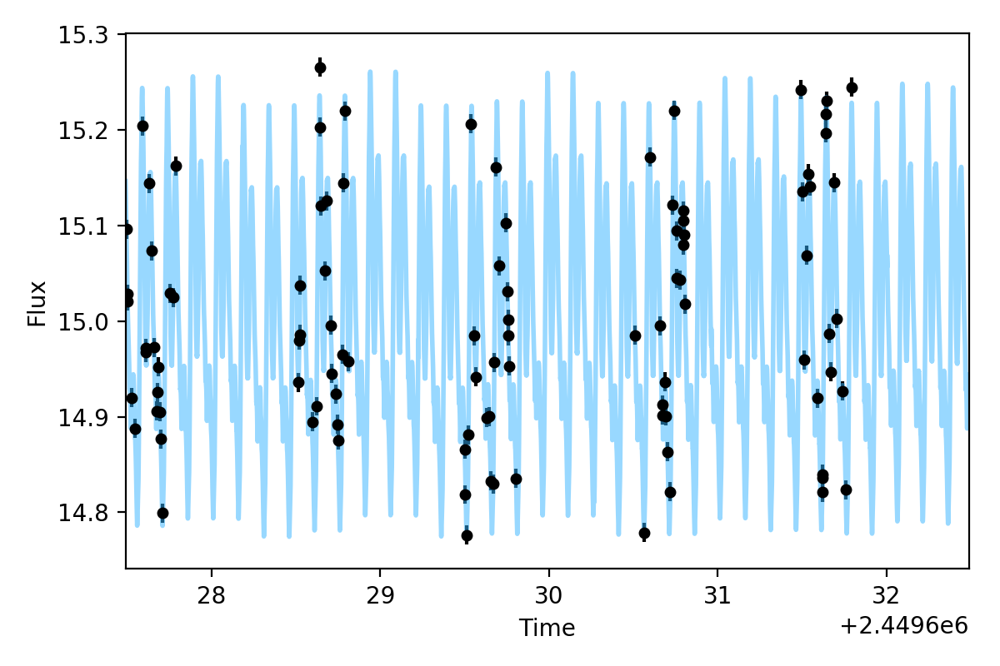

In [71]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
plot_lightcurve(tsample, fsample, flux_err=ferr, true_lightcurve=[tshort, fshort+mean_mag-1], 
                    models=None, ax=ax)

plt.tight_layout()

Let's get out some example models:

In [72]:
nsamples = new_samples.shape[0]

nmodels = 10

idx = np.random.choice(np.arange(0, nsamples, 1, dtype=int), size=nmodels)

m_all = np.zeros((nmodels, t_pred.shape[0]))

for i,j in enumerate(idx):
    p = new_samples[j]
    mean_model = gp.sample_conditional(fsample, t_pred)
    m_all[i] = mean_model

<IPython.core.display.Javascript object>


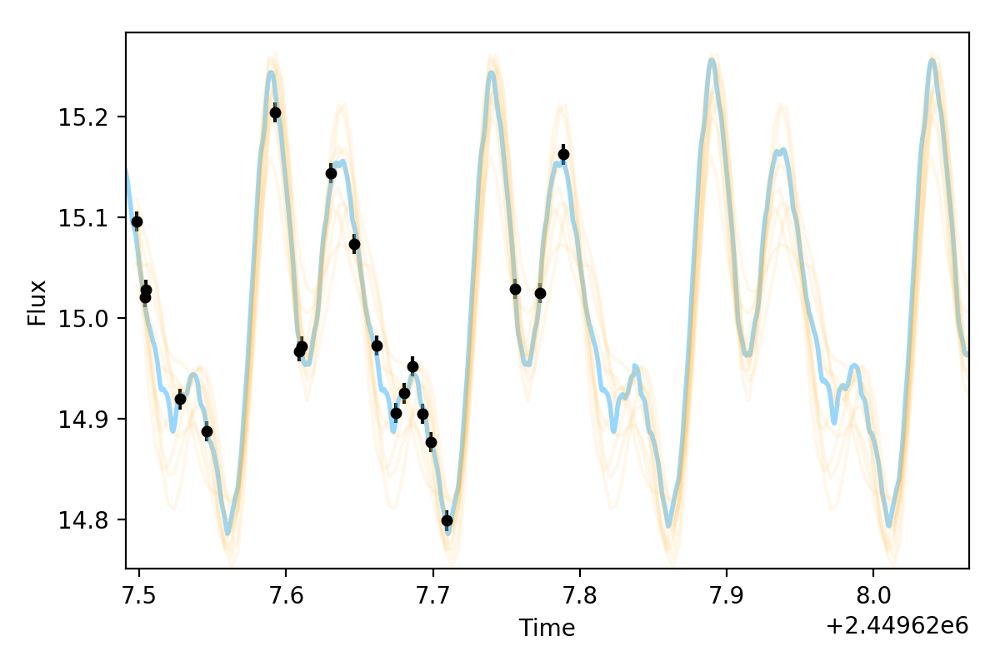

In [73]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
plot_lightcurve(tsample, fsample, flux_err=ferr, true_lightcurve=[tshort, fshort+mean_mag-1], 
                    models=(t_pred, m_all), ax=ax)

plt.tight_layout()

In [74]:
m_all = np.array(m_all)

<IPython.core.display.Javascript object>


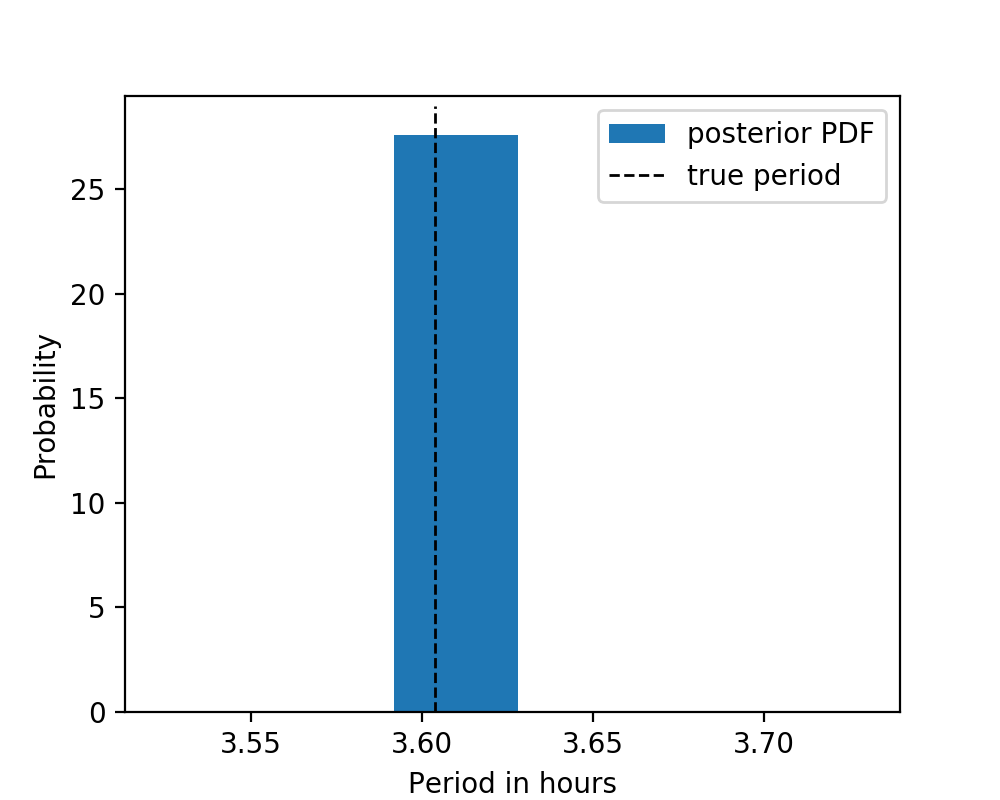

/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


In [75]:
fig, ax = plt.subplots(1, 1, figsize=(5,4))
ax.hist(new_samples[:,-1]*24., bins=100, normed=True, label="posterior PDF")
ax.vlines(true_period, 0, ax.get_ylim()[1], lw=1, color="black", linestyle="dashed", label="true period")
#ax.vlines(true_period/2., 0, 200, lw=1, color="black", linestyle="dashed", label="0.5*true period")

#plt.yscale("log")
ax.set_xlabel("Period in hours")
ax.set_ylabel("Probability")
ax.legend()

One thing I should do is try to find the modes and then fold on that period to plot. Let's write a function for that:

In [76]:
def plot_folded_lightcurve(time, flux, period, flux_err=None, models=None, true_lightcurve=None, 
                      ax=None, use_radians=False, legend=True, colours=None):
    """
    Plot a folded periodic light curve, potentially including the true underlying 
    model that produced the data (in the case of simulations), or model 
    light curves from MCMC. 
    
    Parameters
    ----------
    time : numpy.ndarray
        The time stamps of the periodic light curve
        
    flux : numpy.ndarray
        Flux measurements corresponding to the time stamps
         
    flux_err : numpy.ndarray
        The flux uncertainties corresponding to the data. 
        
    period : float
        The period on which to fold **in hours**
        
    models : iterable of shape (model_time, numpy.ndarray of shape (nsamples, len(model_time)))
        First element here contains the time stamps for the models (which may not be the same 
        as for the data), the second is an array of shape (nsamples, ndatapoints), where nsamples 
        is the number of model light curves, and ndatapoints == len(model_time)
        
    true_lightcurve : iterable containing (true_time, true_flux)
        In the case of simulated data, this contains the times and flux values from which the 
        simulated data was created (could be higher-resolution than the "data"), useful for 
        comparison between models created e.g. from MCMC samples and the true underlying process

        
    ax : matplotlib.Axes object
        An Axes object in which to plot the results. If not given, the code will create a 
        new figure.
        
    use_radians : bool, default False
        If True, the phase will be plotted from (0, 2pi) instead of (0,1), which is the default.
        
    legend : bool, default True
        If True, include a legend in the plot
    
    colours : [str, str, str]
        List of (up to) three colours. First colour is used for the data, the second 
        colour for the true underlying data, the third for the models.

    Returns
    -------
    
    ax : matplotlib.Axes object
        The object with the plot
    
    """
    
    if colours is None:
        colours = ["black", "#33B3FF", "#FFB733"]

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(6,4))
    
    t0 = np.min(time)
    if models:
        t0 = np.min([t0, np.min(models[0])])
    
    if true_lightcurve:
        t0 = np.min([t0, np.min(true_lightcurve[0])])
    
    phase = (time-t0)/period - np.floor((time-t0)/period)
    
    if use_radians:
        phase *= 2.*np.pi
    
    if flux_err is None:
        ax.scatter(phase, flux, s=5, color=colours[0], label="data")
    else:
        ax.errorbar(phase, flux, yerr=flux_err, fmt="o", c=colours[0], markersize=5, label="data")
    
    if true_lightcurve:
        true_time = (true_lightcurve[0] - t0)
        true_flux = true_lightcurve[1]
        true_phase = true_time/period - np.floor(true_time/period)
        
        if use_radians:
            true_phase *= 2.*np.pi

        # compute the difference from one phase bin to the next
        tdiff = np.diff(true_phase)
        # find all differences < 0, which is where the phase wraps around
        idx = np.where(tdiff < 0)[0]

        # loop through indices where phase goes from 1 (or 2pi) to 0
        # plot each phase light curve separately
        istart = 0
        iend = idx[0]+1
        
        # first phase cycle also contains the label for the legend
        ax.plot(true_phase[istart:iend], true_flux[istart:iend], alpha=0.3, 
                c=colours[1], label="true light curve")

        for i, x in enumerate(idx[:-1]):
            ax.plot(true_phase[istart:iend], true_flux[istart:iend], alpha=0.3, c=colours[1])
            istart = x+1
            iend = idx[i+1]+1        
        
        # last plot
        istart = idx[-1]+1
        ax.plot(true_phase[istart:], true_flux[istart:], alpha=0.3, c=colours[1])
    
    if models:
        m_time = (models[0] - t0)
        m_flux = models[1]
        
        m_phase = (m_time/period) - np.floor(m_time/period)
        if use_radians:
            m_phase *= 2.*np.pi
        
        # compute the difference from one phase bin to the next
        tdiff = np.diff(m_phase)
        # find all differences < 0, which is where the phase wraps around
        idx = np.where(tdiff < 0)[0]

        
        # loop through the different samples
        for i,m in enumerate(m_flux):
            # loop through indices where phase goes from 1 (or 2pi) to 0
            # plot each phase light curve separately
            istart = 0
            iend = idx[0]+1
            
            if i == 0:
                # first phase cycle also contains the label for the legend
                ax.plot(m_phase[istart:iend], m[istart:iend], alpha=0.1, 
                        c=colours[2], label="model")

            else:
                ax.plot(m_phase[istart:iend], m[istart:iend], alpha=0.1, 
                        c=colours[2])

            for j, x in enumerate(idx[:-1]):
                ax.plot(m_phase[istart:iend], m[istart:iend], alpha=0.1, c=colours[2])
                istart = x+1
                iend = idx[j+1]+1        

            # last plot
            istart = idx[-1]+1
            ax.plot(m_phase[istart:], m[istart:], alpha=0.1, c=colours[2])

    if legend:
        ax.legend()
    ax.set_xlabel("Rotational Phase")
    ax.set_ylabel("Plot")
    ax.set_title(r"period $P = %.3f$"%period)
    if use_radians:
        ax.set_xlim(0, 2*np.pi)
    else:
        ax.set_xlim(0, 1)
    return ax
    

<IPython.core.display.Javascript object>


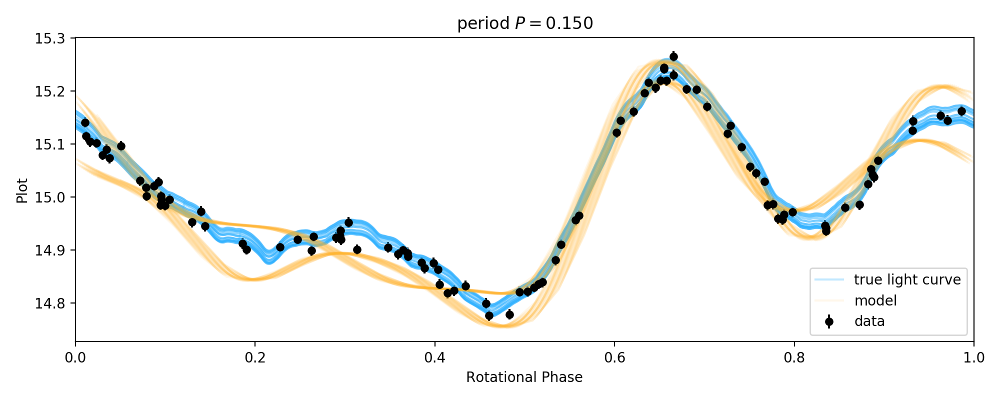

In [77]:
fig, ax1 = plt.subplots(1, 1, figsize=(10,4))

plot_folded_lightcurve(tsample, fsample, true_period/24., flux_err=ferr, 
                  models=[t_pred, m_all[:2]], 
                  true_lightcurve=[tshort, fshort+mean_mag-1], ax=ax1, use_radians=False)

plt.tight_layout()

### Functionize the GP Code

Let's make a couple of functions out of the GP code so that I can use it faster:

In [78]:

## SET UP THE GP
def setup_periodic_gp(time, flux, flux_err, change_term=False):
    """
    
    Parameters
    ----------
    time : 
    
    flux : 
    
    flux_err : 
    
    change_term : bool, default False
        If False, use only an ExpSine2Kernel (simple squared sine); if True,
        include a ExpSquared kernel (to model longer-term variations)
    
    Returns
    -------
    gp : george.GP object
        The GaussianProcess object
    """
    # starting parameters
    gamma = 1.0
    log_period = np.log(5.8/24.0)
    amp = 3.0

    amp2 = 1.0
    metric = 1.0

    kk = amp * kernels.ExpSine2Kernel(gamma=gamma, log_period=log_period)
    if change_term:
        k2 = amp2 * kernels.ExpSquaredKernel(metric=metric) 
        kk *= k2
    
    gp = george.GP(kk, mean=np.mean(flux), fit_mean=True,
               white_noise=np.log(np.mean(flux_err)))
    gp.compute(time)

    return gp

# sample the GP
def sample_gp(time, flux, flux_err, change_term=False, pred_points=1000,
              nlive=500, bound="multi", sample="rwalk"):

    # set up the GP
    gp = setup_periodic_gp(time, flux, flux_err, change_term=change_term)

    t0 = np.min(time)
    tmax = np.max(time)
    
    t_pred = np.linspace(t0, tmax, pred_points)

    ndim = len(gp.get_parameter_vector())

    # Define the objective function (negative log-likelihood in this case).
    def nll(p):
        gp.set_parameter_vector(p)
        ll = gp.log_likelihood(flux, quiet=True)
        return -ll if np.isfinite(ll) else 1e25

    # And the gradient of the objective function.
    def grad_nll(p):
        gp.set_parameter_vector(p)
        return -gp.grad_log_likelihood(flux, quiet=True)

    # You need to compute the GP once before starting the optimization.
    gp.compute(time)

    # Run the optimization routine.
    p0 = gp.get_parameter_vector()
    results = op.minimize(nll, p0, jac=grad_nll, method="L-BFGS-B")


    # Update the kernel and print the final log-likelihood.
    gp.set_parameter_vector(results.x)

    # set up the sampling from the prior
    def from_prior(u):

        # prior transform for the mean value
        min_mag = 12
        max_mag = 20
        pmean = (max_mag - min_mag) * u[0] + min_mag

        # prior transform for the GP log-constant
        min_logamp = -20
        max_logamp = 20
        plogamp = (max_logamp - min_logamp) * u[1] + min_logamp

        # prior transform for the kernel gamma
        min_loggamma = np.log(0.001)
        max_loggamma = np.log(100.0)
        ploggamma = (max_loggamma - min_loggamma) * u[2] + min_loggamma

        # prior transform for the log-period
        min_period = 1./24.0
        max_period = 1.0

        pperiod = (max_period - min_period) * u[3] + min_period

        if change_term:
            min_logamp2 = -20
            max_logamp2 = 20
            plogamp2 = (max_logamp2 - min_logamp2) * u[4] + min_logamp2

            min_logmetric = -10
            max_logmetric = 10
            plogmetric = (max_logmetric - min_logmetric) * u[5] + min_logmetric
    
            return np.array([pmean, plogamp, ploggamma, pperiod, plogamp2, plogmetric])
        else:
            return np.array([pmean, plogamp, ploggamma, pperiod])
        
    # set up the log-lilkelihood
    def loglike(p):
        # this is if the change-term is included:
        if change_term:
            pnew = [p[0], p[1], np.exp(p[2]), np.log(p[3]), p[4], p[5]]
        else:
            pnew = [p[0], p[1], np.exp(p[2]), np.log(p[3])]

        gp.set_parameter_vector(pnew)
        ll = gp.log_likelihood(flux, quiet=True)
        return ll if np.isfinite(ll) else -1e25
    
    # set up the DynamicNestedSampling sampler
    sampler = dynesty.DynamicNestedSampler(loglike, from_prior, ndim, nlive=nlive, 
                                    bound=bound, sample=sample)

    sampler.run_nested(nlive_init=1000)
    
    return sampler

Let's also make a function to plot the results:

In [106]:
def plot_sampling_results(time, flux, flux_err, gp, sampler, t_pred=None, true_lightcurve=None,
                          true_period=None, namestr="test", change_term=False, nmodels=10, npred=1000):
    
    # get results out of sampler
    results = sampler.results
    
    # make a trace plot
    fig, axes = dyplot.traceplot(results, 
                             truth_color='black', show_titles=True,
                             trace_cmap='viridis', connect=True,
                             connect_highlight=range(5))
    plt.tight_layout()
    plt.savefig(namestr + "_traceplot.pdf", format="pdf")
    
    # get out samples and weights
    samples, weights = results.samples, np.exp(results.logwt - results.logz[-1])
    mean, cov = dyfunc.mean_and_cov(samples, weights)

    # resample from weights
    new_samples = dyfunc.resample_equal(samples, weights)

    # make a corner plot
    corner.corner(new_samples, labels=gp.get_parameter_names())
    
    # save to file
    plt.savefig(namestr + "_corner.pdf", format="pdf")
    

    # plot some light curves with example models
    
    # first, get the total number of available samples
    nsamples = new_samples.shape[0]

    # get some random samples from the 
    idx = np.random.choice(np.arange(0, nsamples, 1, dtype=int), size=nmodels)

    # if the array for the predictions isn't given, make one
    if t_pred is None:
        t_pred = np.linspace(time[0], time[-1], npred)
    
    # empty array for output
    m_all = np.zeros((nmodels, t_pred.shape[0]))

    # loop through the indices of samples, for each sample from the GP
    # conditional on the data points
    for i,j in enumerate(idx):
        p = new_samples[j]
        if change_term:
            pnew = [p[0], p[1], np.exp(p[2]), np.log(p[3]), p[4], p[5]]
        else:
            pnew = [p[0], p[1], np.exp(p[2]), np.log(p[3])]

        gp.set_parameter_vector(pnew)
        mean_model = gp.sample_conditional(fsample, t_pred)
        m_all[i] = mean_model

    fig, ax = plt.subplots(1, 1, figsize=(6,4))
    plot_lightcurve(tsample, fsample, flux_err=ferr, true_lightcurve=true_lightcurve, 
                        models=(t_pred, m_all), ax=ax)

    plt.tight_layout()
    plt.savefig(namestr + "_lc.pdf", format="pdf")

    
    # plot histogram of periods
    fig, ax = plt.subplots(1, 1, figsize=(5,4))
    if change_term:
        ax.hist(new_samples[:,-3]*24., bins=100, normed=True, 
                label="posterior PDF", color="black", alpha=0.5)
    else:
        ax.hist(new_samples[:,-1]*24., bins=100, normed=True, 
                label="posterior PDF", color="black", alpha=0.5)

    if true_period is not None:
        ylim = ax.get_ylim()
        ax.vlines(true_period*24., 0, ylim[-1], lw=1, color="red", linestyle="dashed", label="true period")
    
    ax.set_xlabel("Period in hours")
    ax.set_ylabel("Probability")
    ax.legend()

    plt.tight_layout()
    plt.savefig(namestr + "_period_pdf.pdf", format="pdf")
    
    
    # plot folded light curve

    fig, ax = plt.subplots(1, 1, figsize=(6,4))

    if true_period:
        ax = plot_folded_lightcurve(tsample, fsample, true_period, flux_err=ferr, 
                          models=[t_pred, m_all[:2]], 
                          true_lightcurve=true_lightcurve, ax=ax, use_radians=False)
    else:
        ax = plot_folded_lightcurve(tsample, fsample, best_period, flux_err=ferr, 
                          models=[t_pred, m_all[:2]], 
                          true_lightcurve=true_lightcurve, ax=ax, use_radians=False)

    plt.tight_layout()
    plt.savefig(namestr + "_folded_lc.pdf", format="pdf")
    
    return

### Examples of Different Sampling Patterns (with few Data Points for Speed)

I'm going to try out my different sampling patterns with 50 data points each to make it run reasonably fast.

#### Even number of data points each night

Let's simulate an even number of data points each night, with 10 points per night over five nights:

In [98]:
t_ind = time.searchsorted(time[0]+5.0)

In [99]:
tshort = time[:t_ind]
fshort = flux[:t_ind]

In [100]:
tsample, fsample, ferr = subsample(tshort, fshort, npoints=50, kind="telescope", seed=200, sigma=0.01,
                                   mean_flux = mean_mag-1)

/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


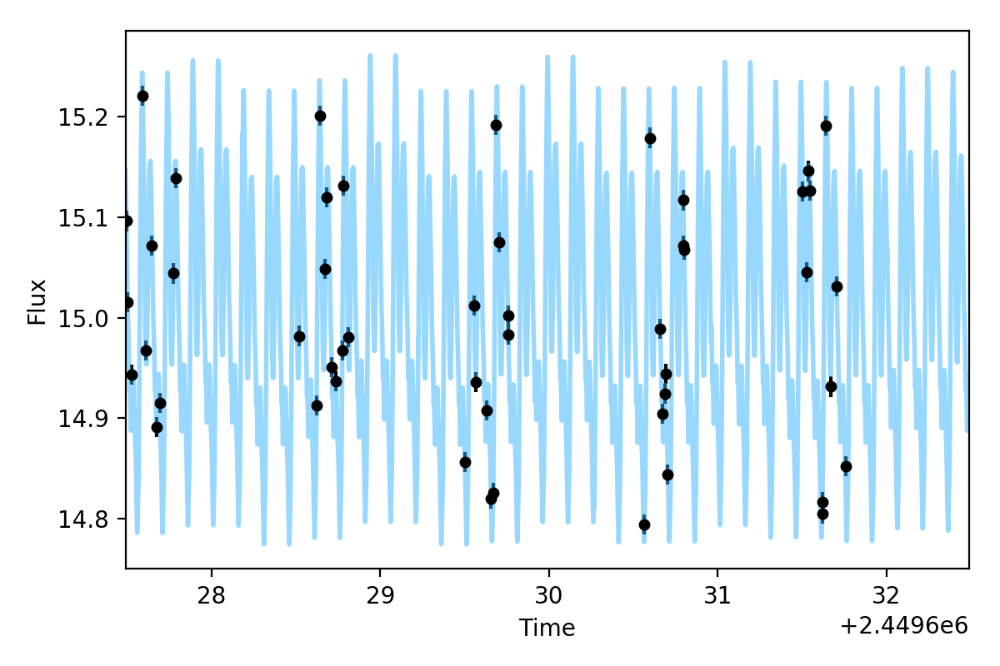

In [101]:
fig, ax = plt.subplots(1, 1, figsize=(6,4))
plot_lightcurve(tsample, fsample, flux_err=ferr, true_lightcurve=[tshort, fshort+mean_mag-1], 
                    models=None, ax=ax)

plt.tight_layout()

In [84]:
len(tsample)

100

Ok, cool. Let's set up the GP:

In [102]:
gp = setup_periodic_gp(tsample, fsample, ferr, change_term=False)

Now we can sample:

In [103]:
sampler = sample_gp(tsample, fsample, ferr, change_term=False, pred_points=1000,
              nlive=500, bound="multi", sample="rwalk")


iter: 29871 | batch: 4 | bound: 905 | nc: 25 | ncall: 671004 | eff(%):  4.452 | loglstar: 48.469 < 54.963 < 53.863 | logz: 38.075 +/-  0.115 | stop:  0.941                         


In [104]:
results = sampler.results

<IPython.core.display.Javascript object>


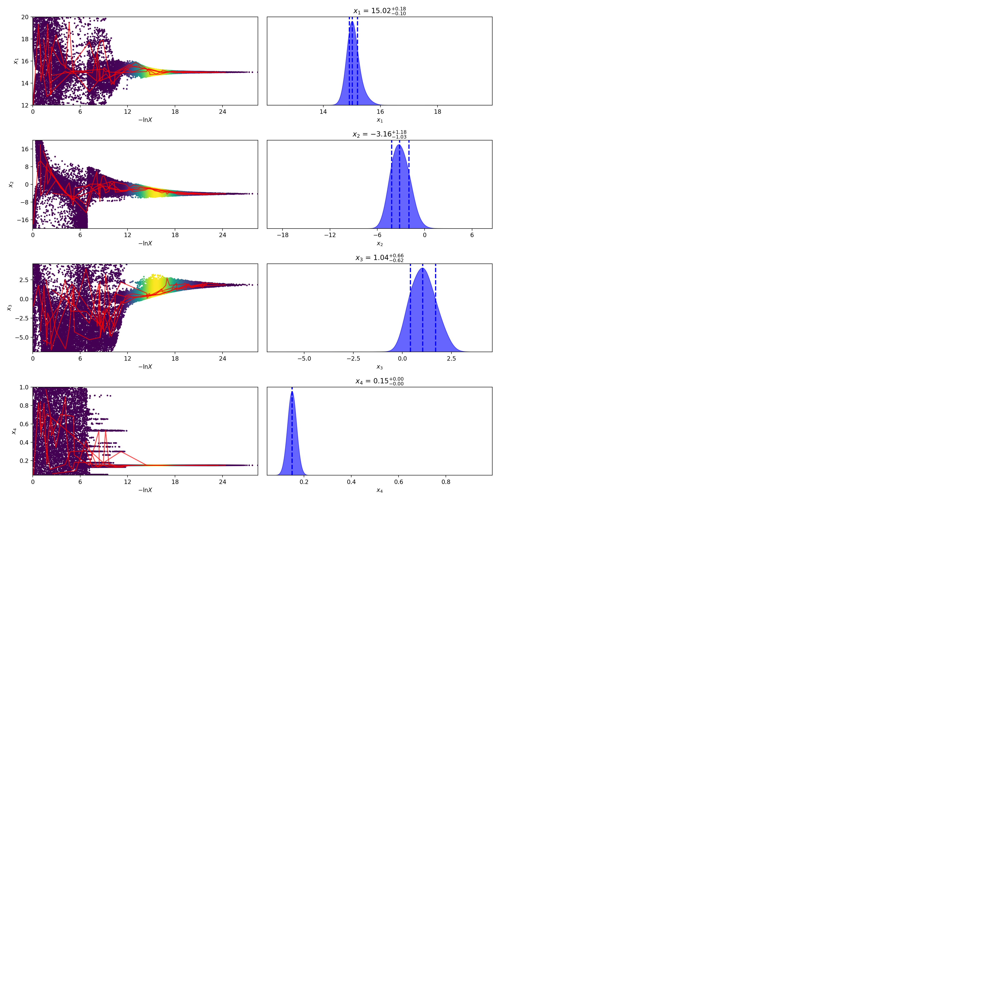

<IPython.core.display.Javascript object>


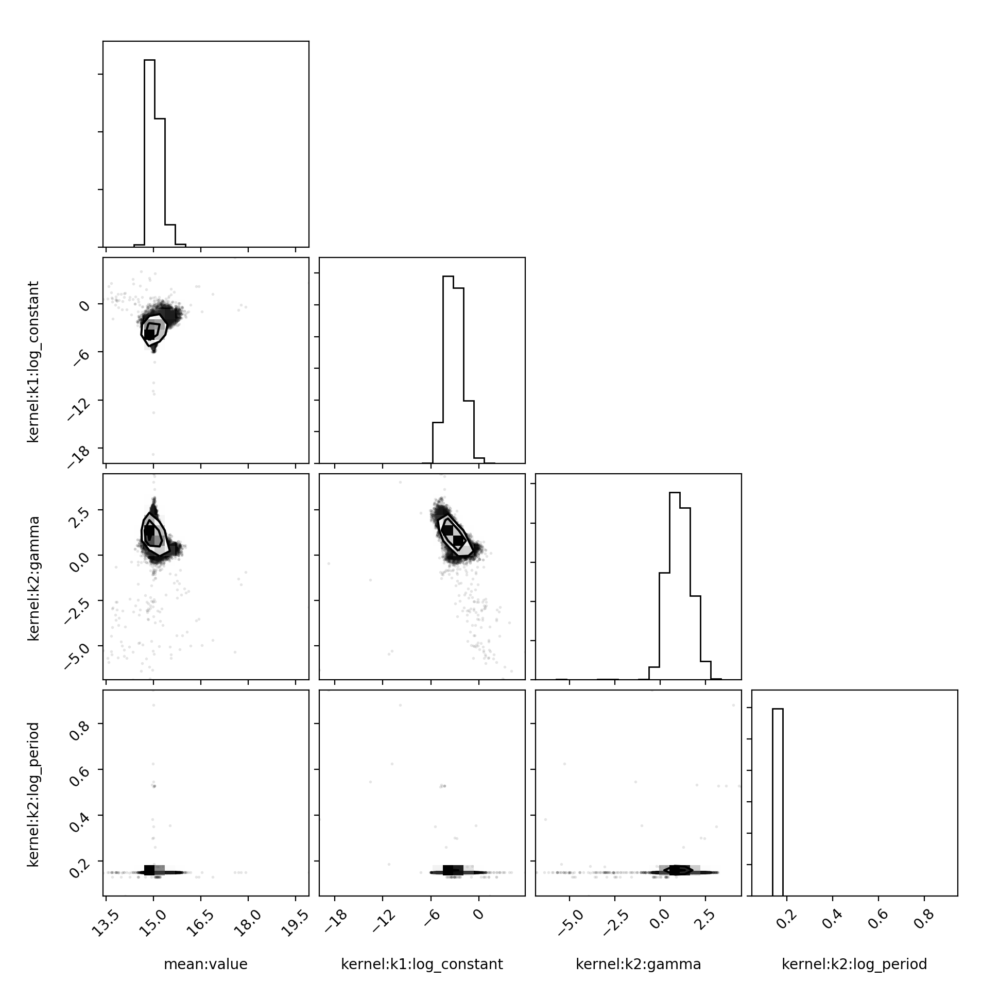

<IPython.core.display.Javascript object>


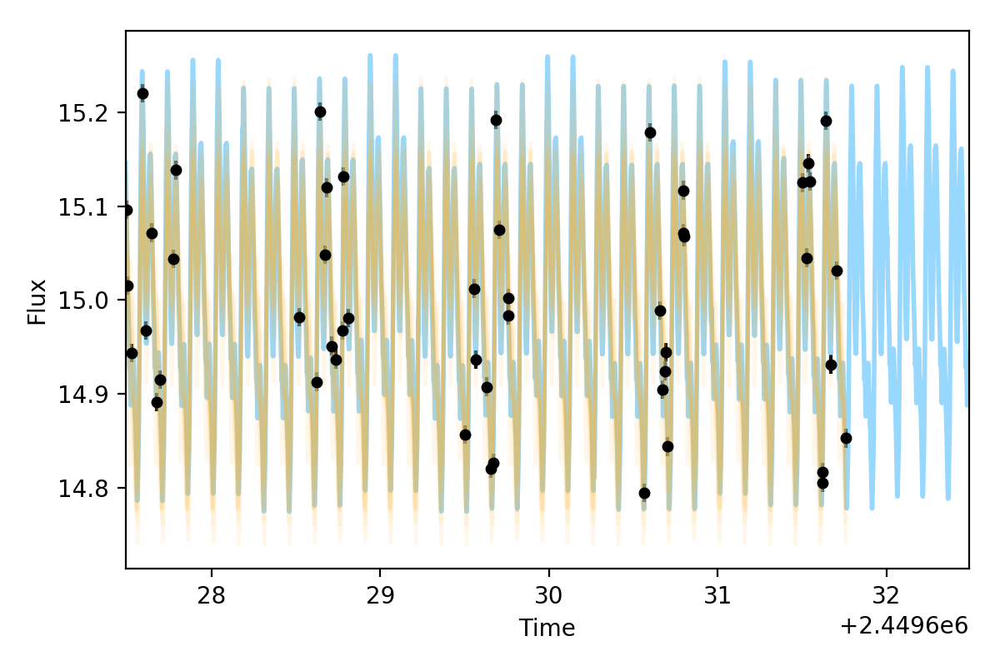

/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


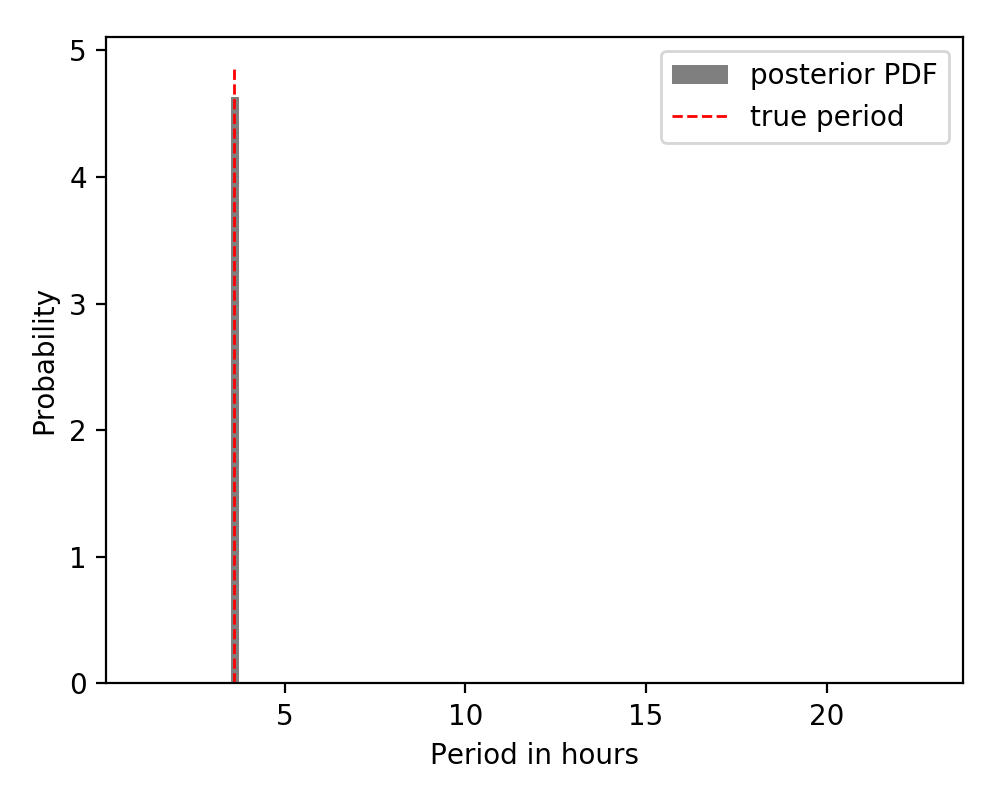

/Users/danielahuppenkothen/work/sw/miniconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


<IPython.core.display.Javascript object>


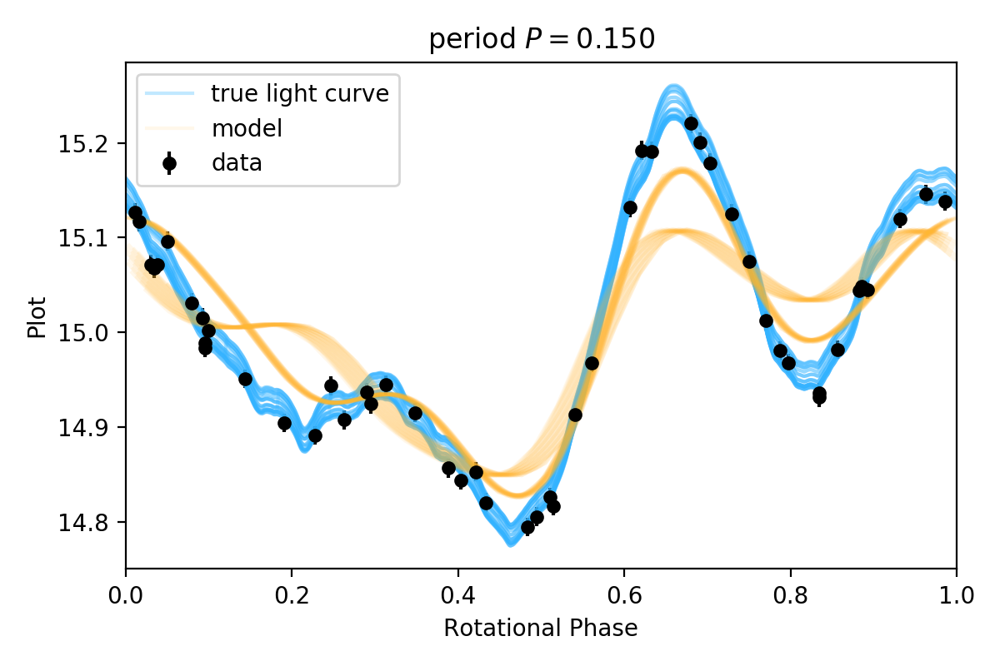

In [107]:
plot_sampling_results(tsample, fsample, ferr, gp, sampler, t_pred=None, true_lightcurve=[tshort, fshort+mean_mag-1],
                          true_period=true_period/24., namestr="3200_test", change_term=False, nmodels=10, npred=1000)

## A Suite of Simulations for different Sampling Patterns

We'd like to test some different samping patterns, and how well I can find the correct period. 

Total number of data points:
- 10
- 50
- 100
- 200
- 500

Number of nights:
- single
- 3
- 5
- 10
- 50

nightly sampling
- every night
- every three nights
- every five nights

* ZTF-like sampling?
* LSST-like sampling?

### Random sampling over K nights for N total data points

* K = [1, 3, 5, 10, 50]
* N = [10, 50, 100, 200, 500]

Let's generate some data:

<IPython.core.display.Javascript object>


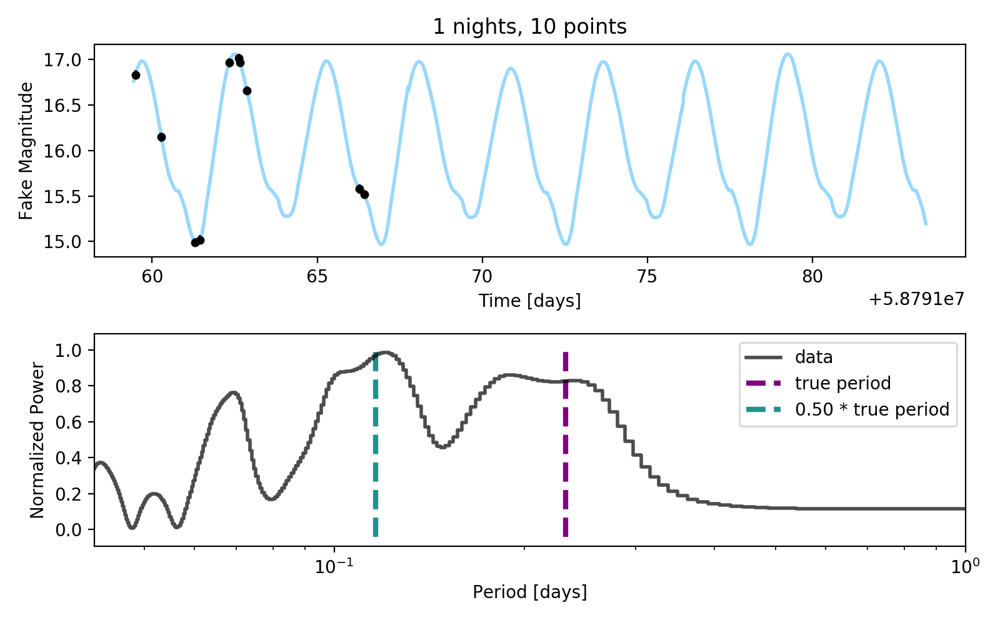

<IPython.core.display.Javascript object>


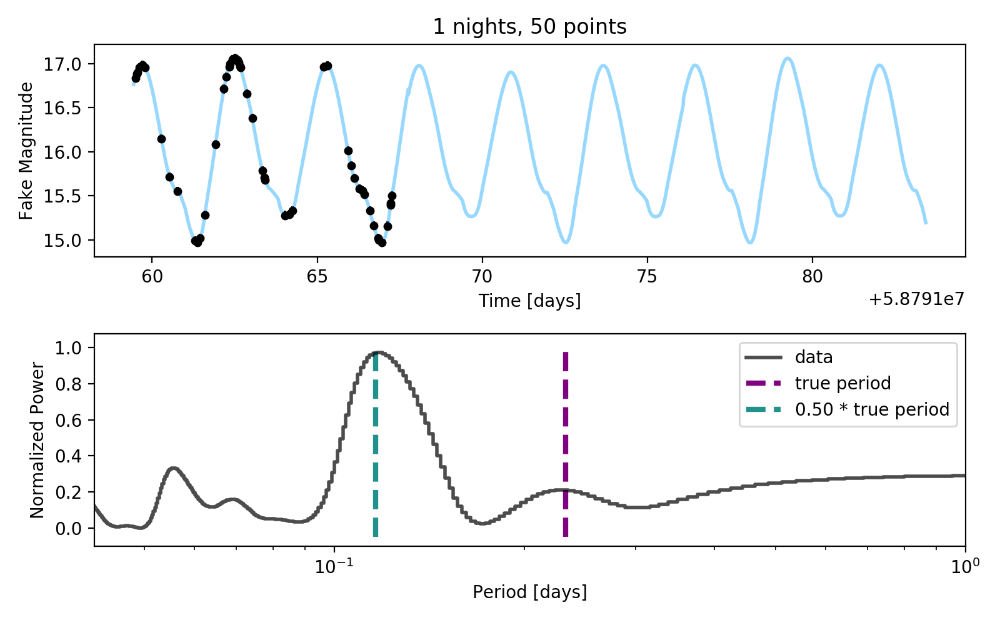

<IPython.core.display.Javascript object>


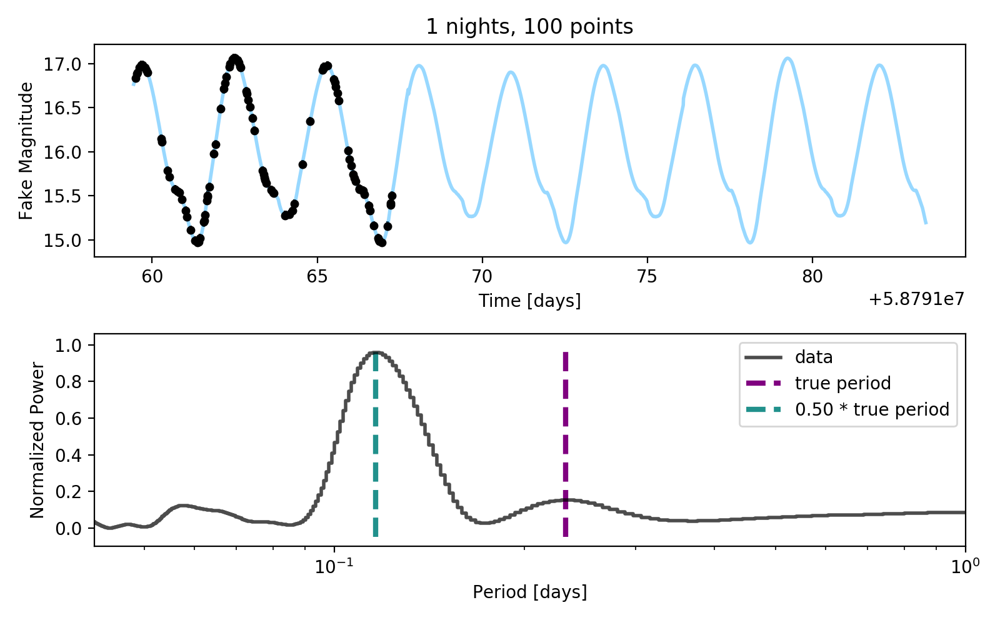

<IPython.core.display.Javascript object>


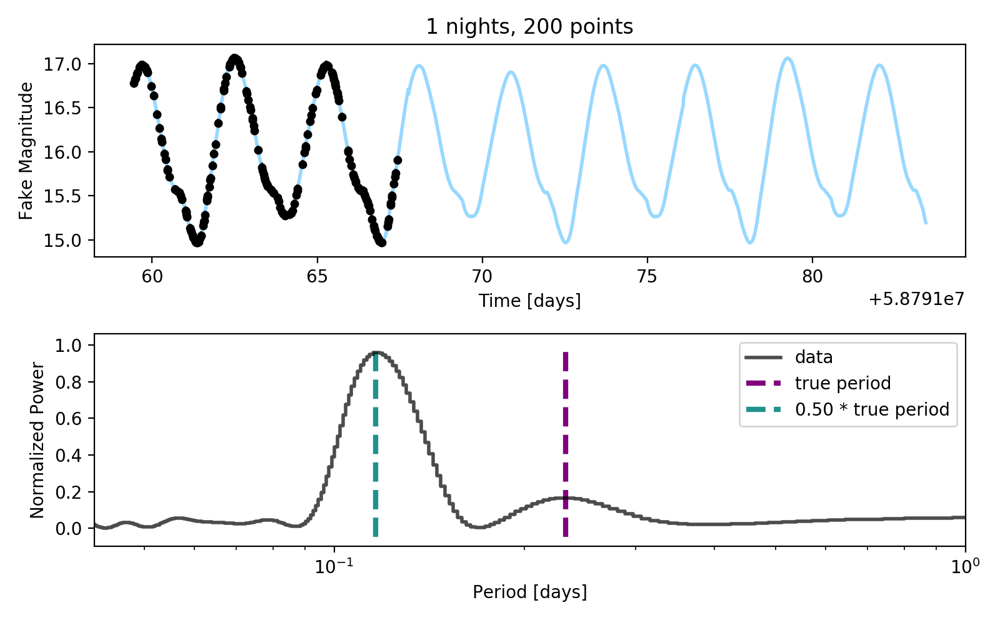

<IPython.core.display.Javascript object>


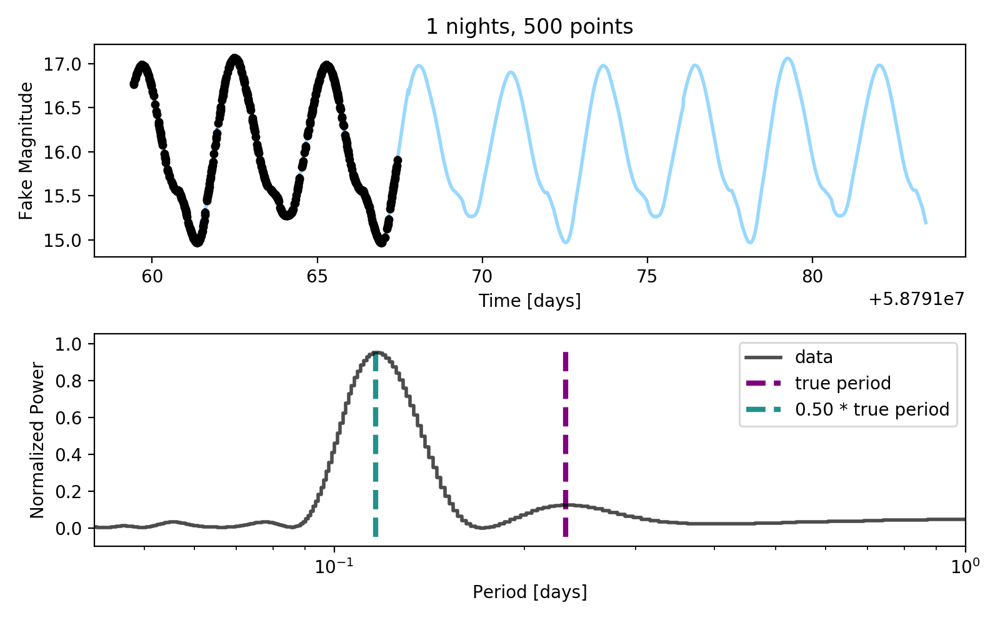

<IPython.core.display.Javascript object>


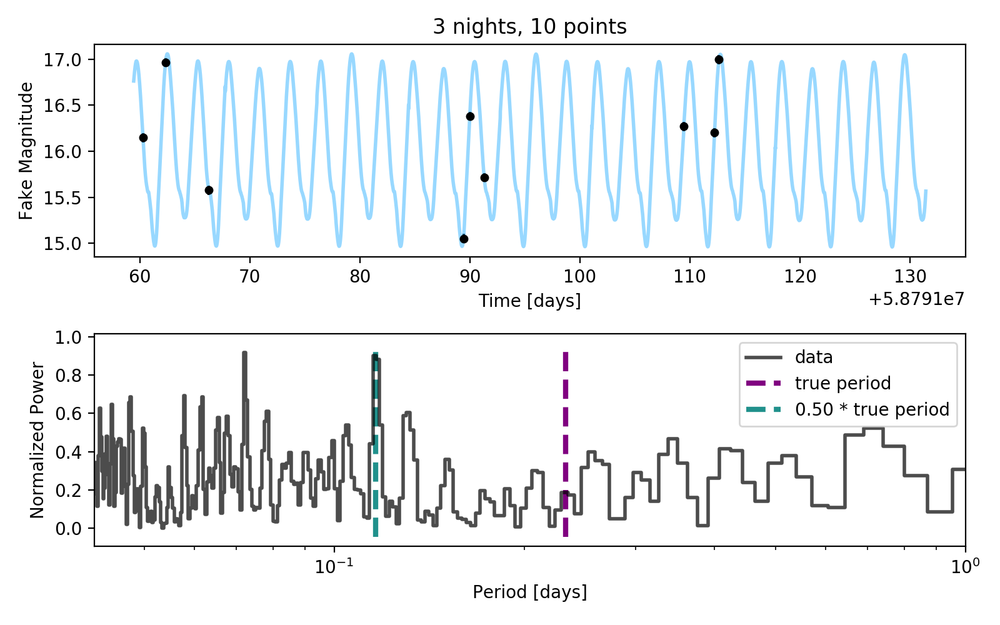

/astro/users/dhuppenk/.conda/envs/dataviz/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


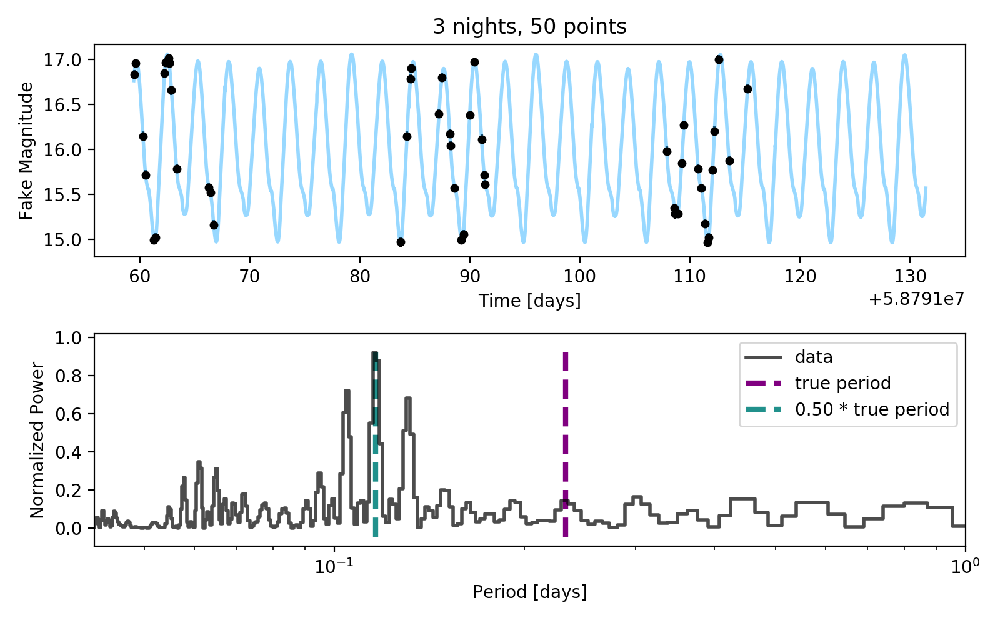

<IPython.core.display.Javascript object>


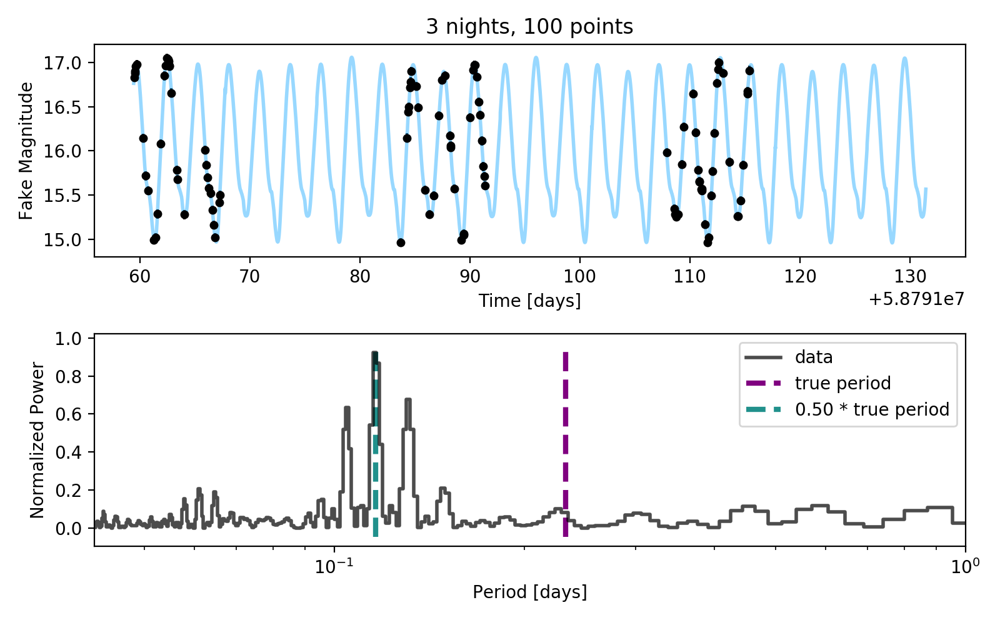

<IPython.core.display.Javascript object>


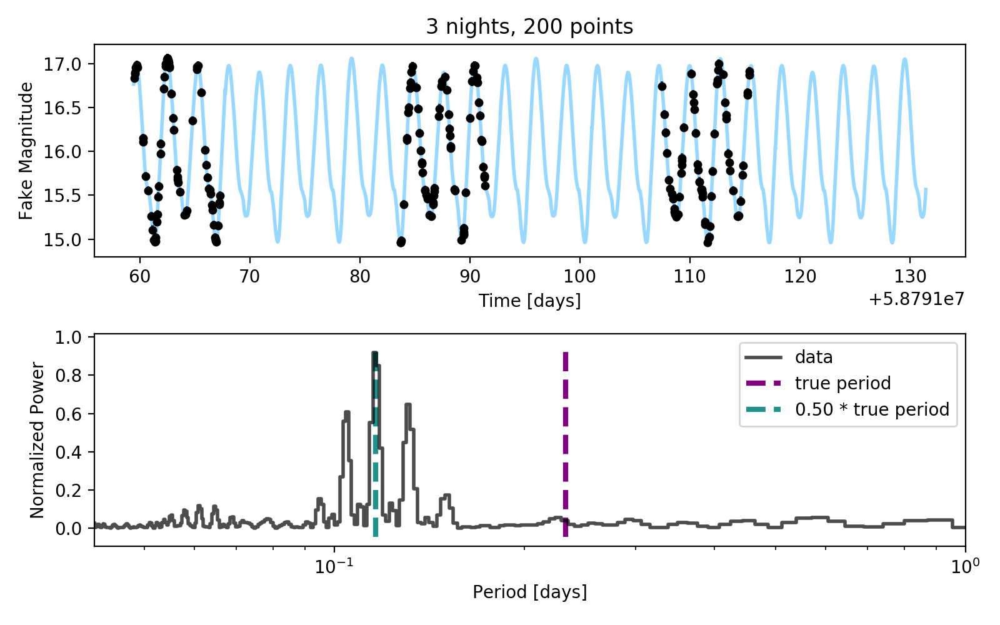

<IPython.core.display.Javascript object>


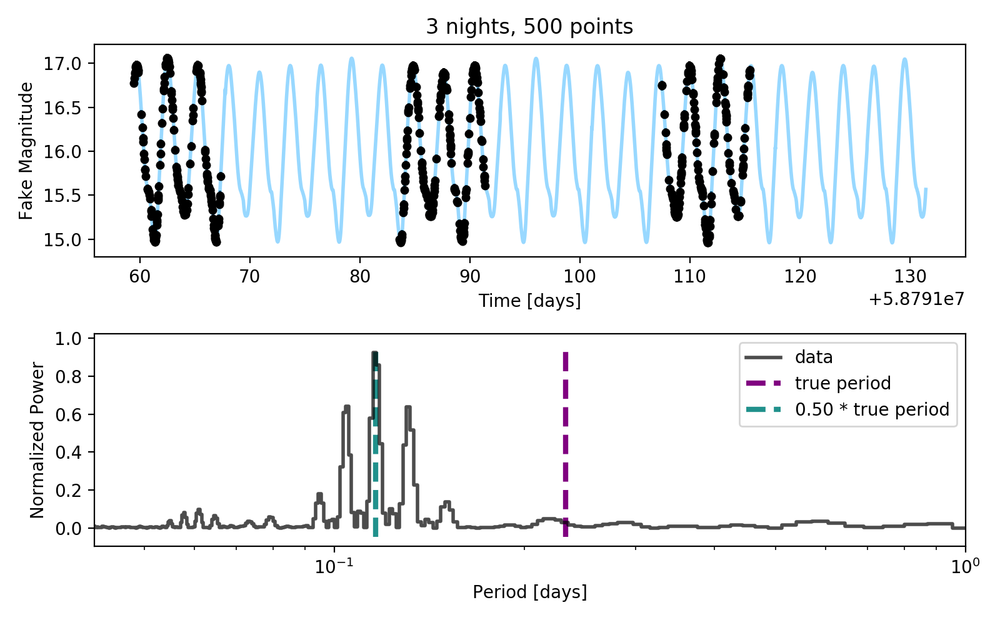

<IPython.core.display.Javascript object>


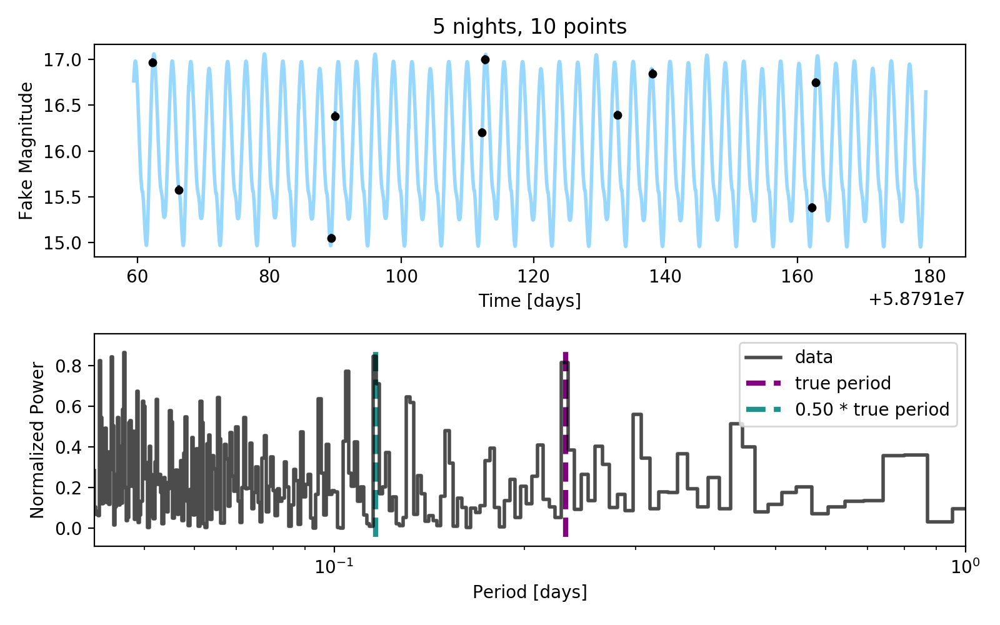

<IPython.core.display.Javascript object>


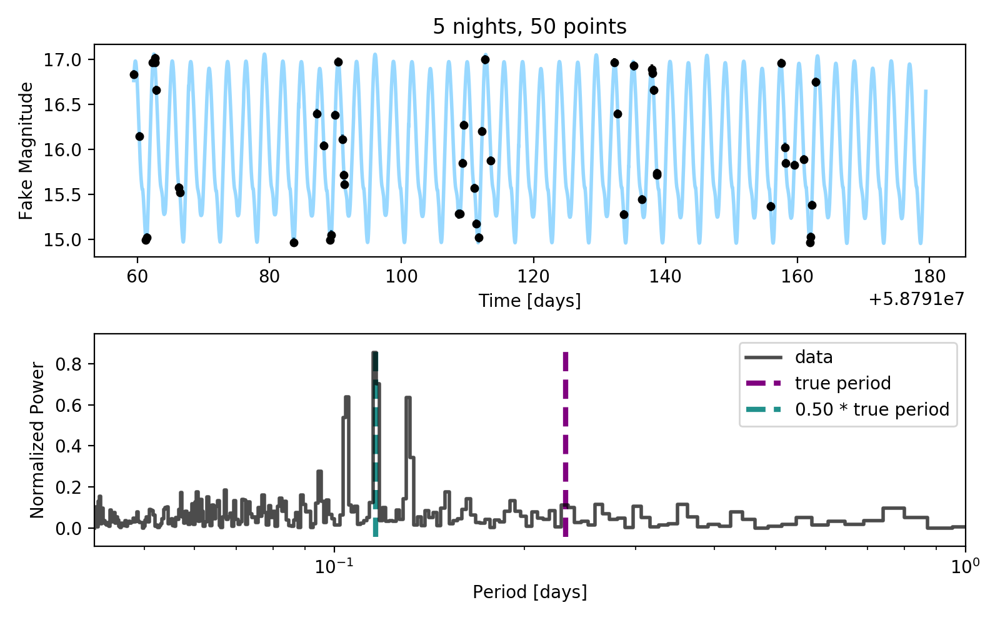

<IPython.core.display.Javascript object>


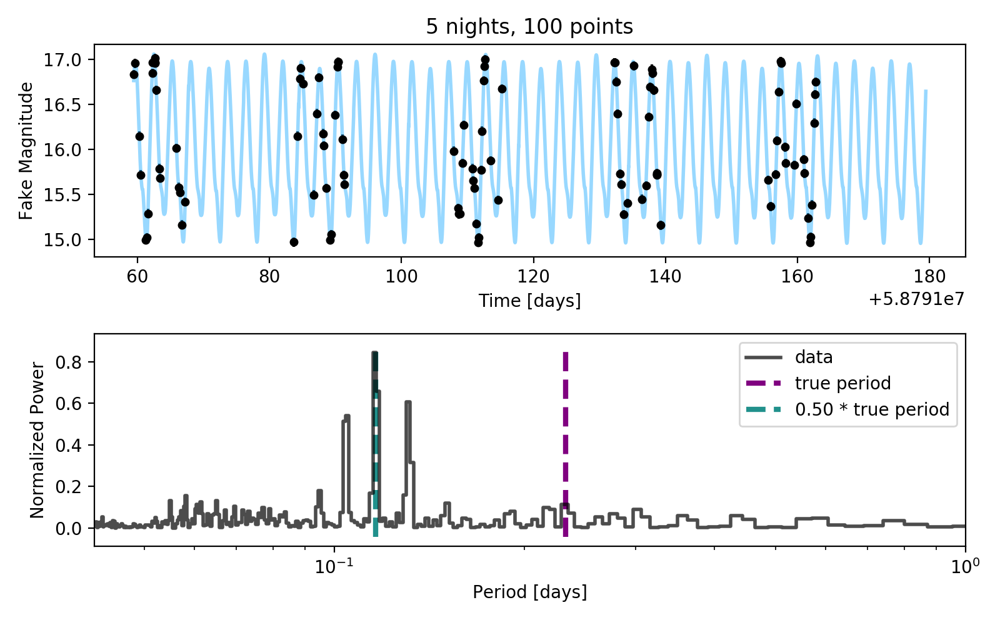

<IPython.core.display.Javascript object>


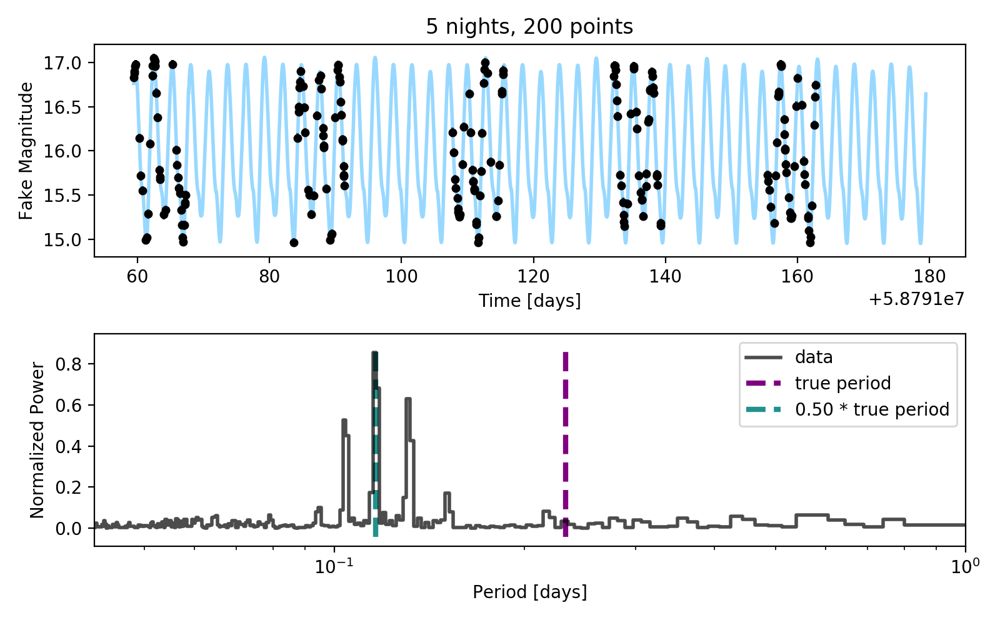

<IPython.core.display.Javascript object>


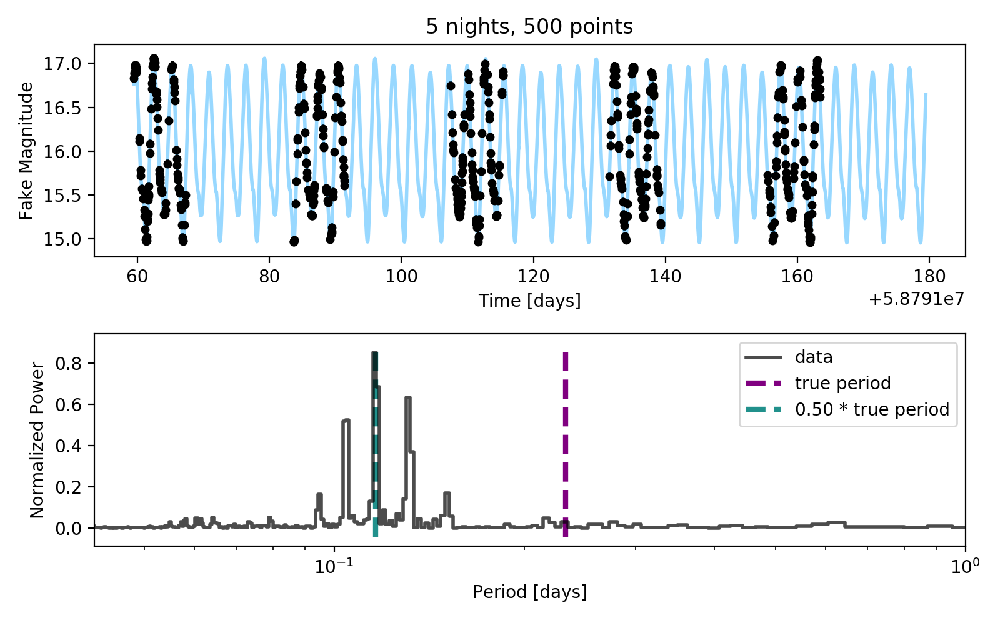

<IPython.core.display.Javascript object>


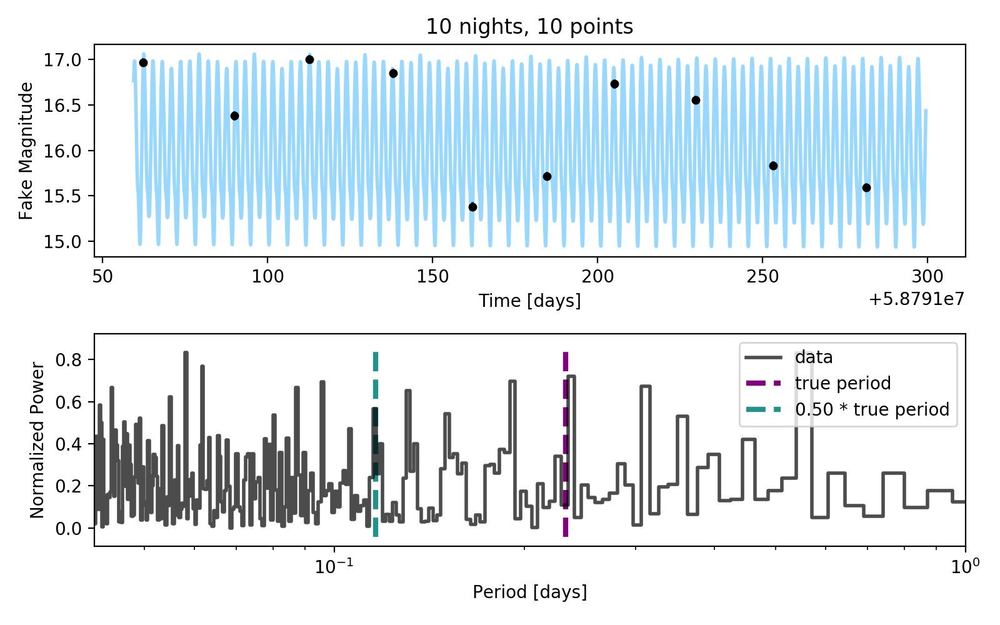

<IPython.core.display.Javascript object>


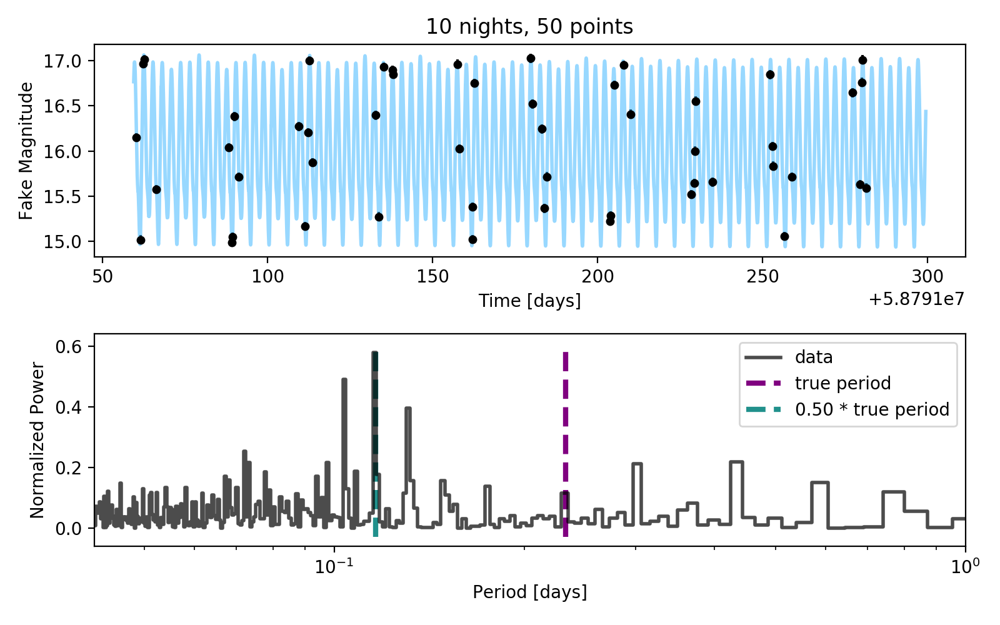

<IPython.core.display.Javascript object>


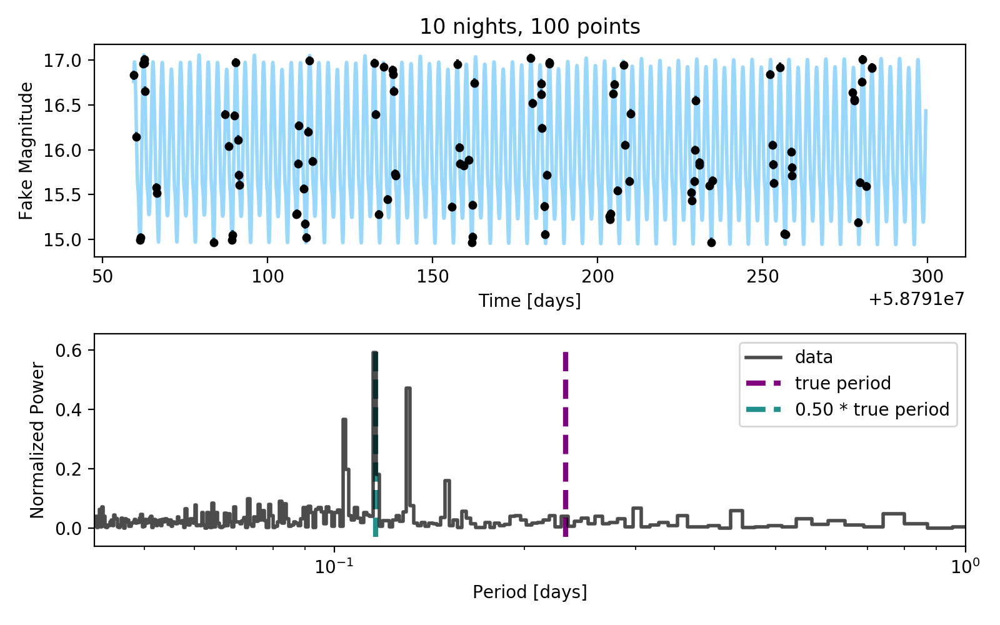

<IPython.core.display.Javascript object>


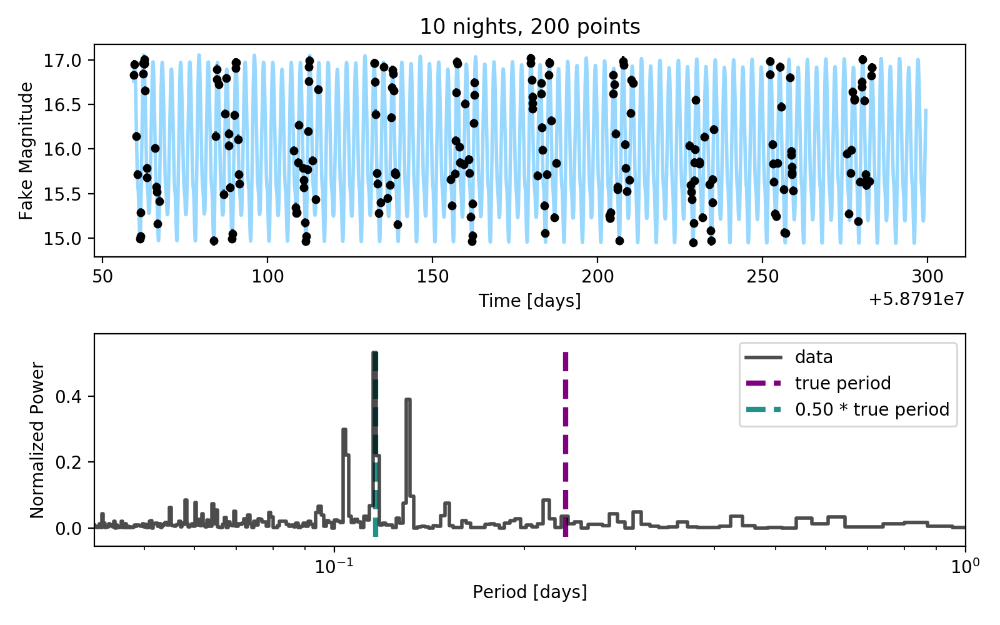

<IPython.core.display.Javascript object>


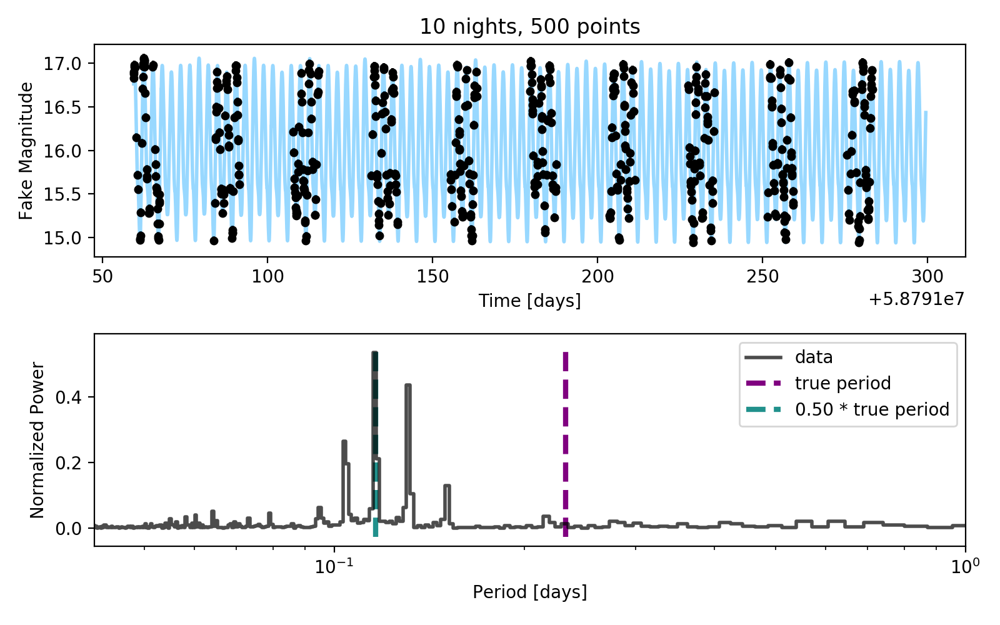

<IPython.core.display.Javascript object>


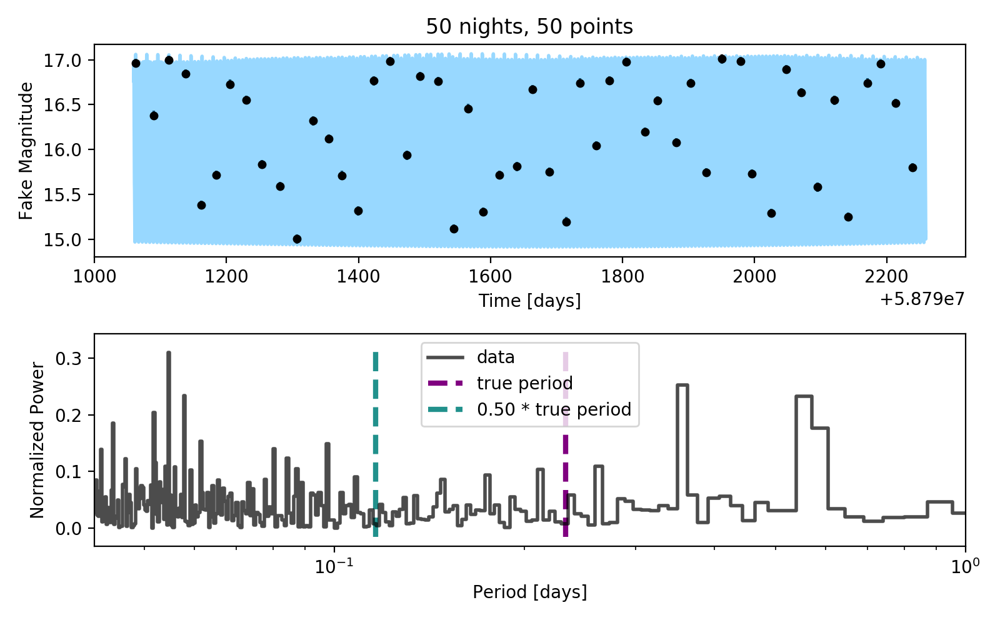

<IPython.core.display.Javascript object>


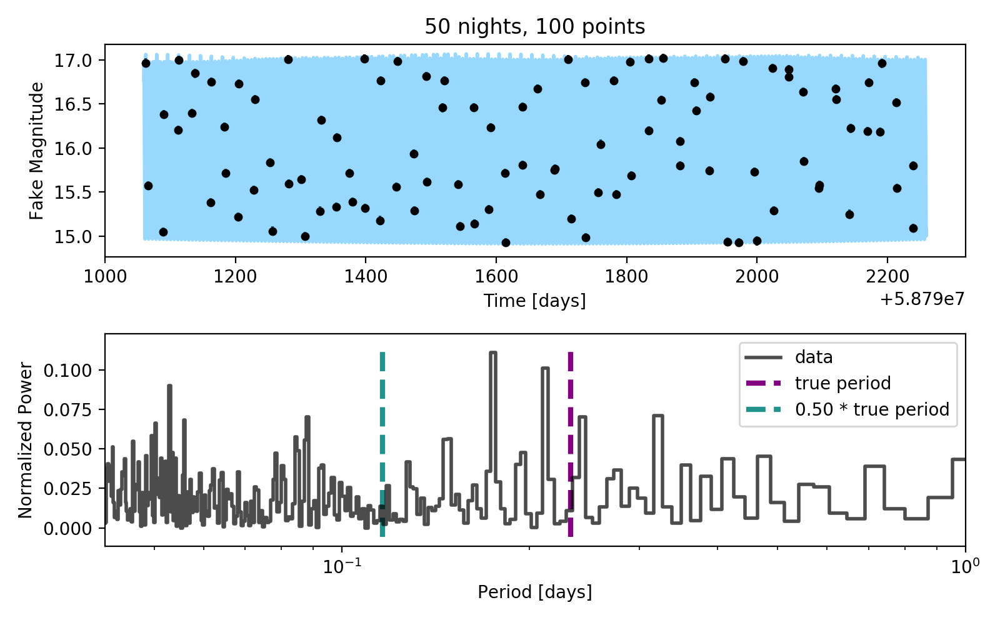

<IPython.core.display.Javascript object>


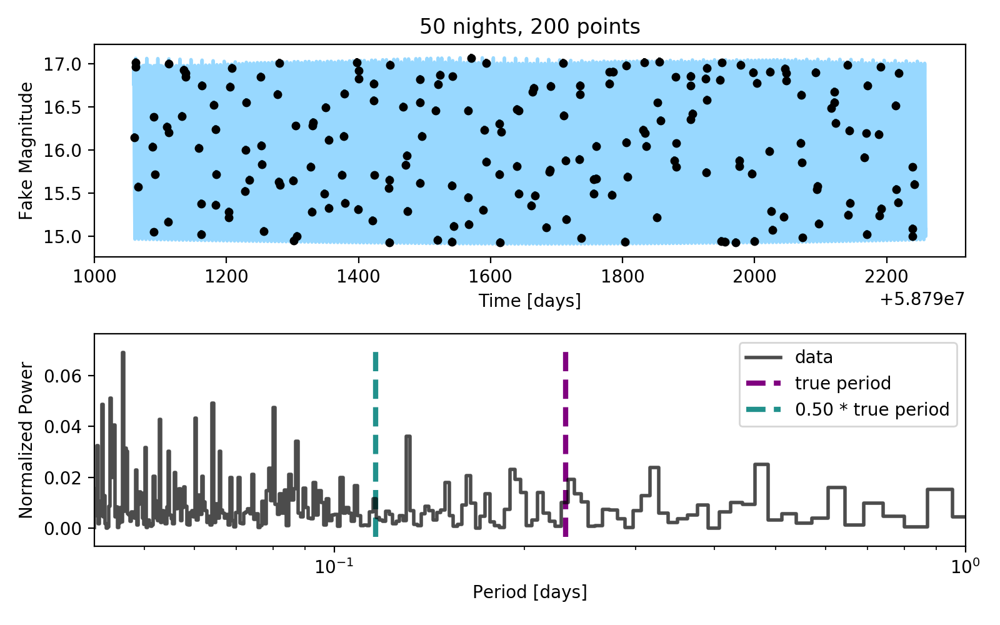

<IPython.core.display.Javascript object>


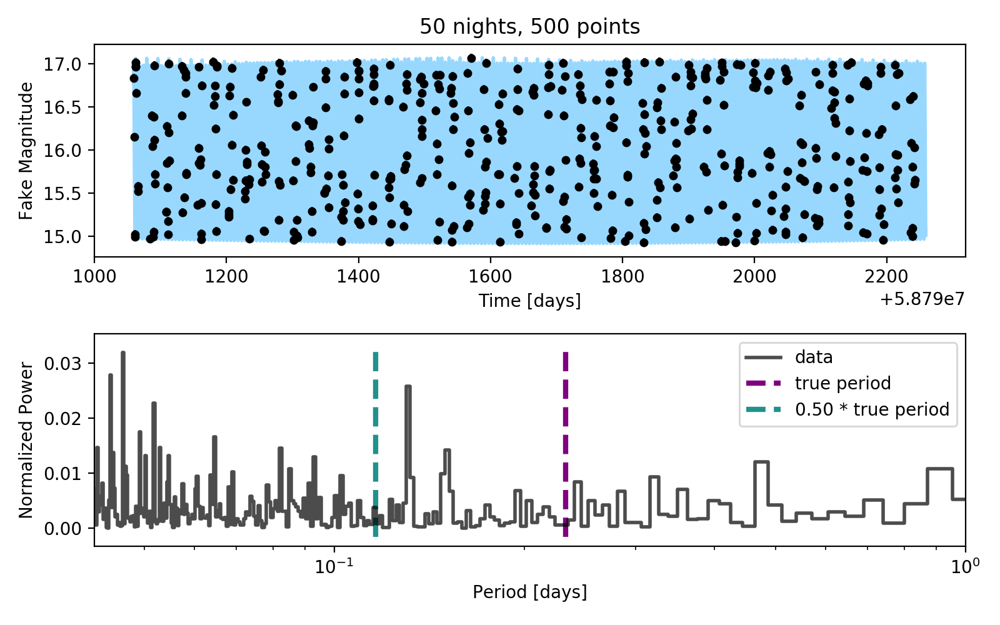

In [213]:
nights = [1, 3, 5, 10, 50]
npoints = [10, 50, 100, 200, 500]

for ni in nights:
    t0 = df.loc[df.index[0], "time"] # start time
    tseg = ni # length of the total light curve
    tmax = t0 + tseg # last data point
    # search for last relevant data point in full time series
    max_ind = np.array(df.time).searchsorted(tmax)
    # restrict time series to only relevant nights
    tshort = np.array(df.time)[:max_ind]
    fshort = np.array(df.flux)[:max_ind]
    
    # save full-resolution light curve in a file
    np.savetxt(datadir+"3200_fullres_%inights.dat"%ni, np.array([tshort, fshort]).T)
    
    # loop through the number of data points:
    for npts in npoints:    
        
        # right now we assume to have at least a data point every night, 
        # so ignore cases where there are more nights than data points
        if ni > npts:
            continue
        # subsample the time series
        tsample, fsample = subsample(tshort, fshort, npoints=npts, kind="telescope", seed=20180622)
        mean_mag = 15.0 # mean magnitude to add to the light curve
        sigmapsf = 0.05 # uncertainty in the flux measurements
        fsample += mean_mag # constant factor to be added to the time series
        frand = np.random.normal(fsample, scale=sigmapsf) # randomize the flux
        ferr = np.zeros_like(frand) + sigmapsf # calculate the array of uncertainties
        
        # plot the light curve and the Lomb-Scargle periodogram
        fig, (ax, ax2) = plt.subplots(2, 1, figsize=(8,5))
        ax.errorbar(tsample*24., fsample, yerr=ferr, fmt="o", markersize=4, color="black")
        ax.plot(tshort*24., fshort+mean_mag, lw=2, color="#33B3FF", alpha=0.5)
        ax.set_title("%i nights, %i points"%(ni, npts))
        ax.set_xlabel("Time [days]")
        ax.set_ylabel("Fake Magnitude")
        
        ax2 = plot_lsp(tsample, fsample, ferr, true_period=true_period/24.0, ax=ax2, 
                       nharmonics=1, oversampling=10)
        plt.tight_layout()
        plt.savefig(datadir+"3200_sample_%inights_%ipoints.pdf"%(ni, npts), format="pdf")
        
        
        np.savetxt(datadir+"3200_sample_%inights_%ipoints.dat"%(ni, npts), np.array([tsample, fsample, ferr]).T)

Ok, cool, let's run the first one:

#### First Test: 1 night, 10 data points

We're going to give this a first try. Let's first read in the correct data:

In [101]:
ni = 1
npts = 10

filename = "3200_sample_%inights_%ipoints.dat"
data = np.loadtxt(datadir+filename%(ni, npts))

In [103]:
time = data[:,0]
flux = data[:,1]
flux_err = data[:,2]

## To Do

### Algorithm Things
- comparison of sampling algorithms



### Data Sampling Patterns
Sparse sampling:
- LSST-like sampling
- ZTF-like sampling (See Lynne's notebook for LCO proposal)

Dense:
- follow-up:
    - 2h period: observe for four hours (if you know the period), equally spaced observations (e.g. every 3 minutes) (one night- a few for rotation period, several times over a semester for shape modeling (different phase angles) 
    - ~8 hours: observe 3 45-s images, go to another, cycle around 8 different asteroids for an entire night
    - same asteroid 4 nights over 2 months